In [43]:
import sys
import os
import pandas as pd
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

sys.path.append(os.path.abspath("../scripts"))

In [44]:
from data_loader import load_clean_data
from metrics import get_sentiment_proportions, compute_sentiment_ratios
from metrics import compute_ratios_comfort
from visualization import (
    plot_percentages, plot_stacked_bar_chart, plot_comfort, plot_exposure, plot_income, 
    plot_stacked_bar_chart_interaction
)
from sentiment_utils import (
    compute_sentiment_metrics, interpret_metrics, plot_sentiment_trend
)

In [45]:
data_path = "../data/muslim_brand_jan_2026.csv"
jan26 = load_clean_data(data_path)

In [46]:
jan26.head()

,Start Date,End Date,What is your religion?,Religion_other,How many Muslim people have you talked to in the last 7 days?,How do you feel about Muslim people in America?,What is your level of education?,Where do you get your news from?,News_other,How comfortable do you feel interacting with Muslims in your community?,...,"If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?","How would you rate your own understanding of Muslim religious practices (e.g., Ramadan, daily prayers)?",Do you feel you have a lot in common with Muslims in America?,"If you had questions about Islam or Muslims, where would you go to learn more?",Have you ever changed your opinion about a group of people after getting to know someone personally,Have you ever been helped by a Muslim?,Gender,Age,Major US Region,Household Income
0,01/10/2026 12:02:27 AM,01/10/2026 12:05:31 AM,Muslim,NaN,5 to 10,Good,Graduate school,FOX News,NaN,Very comfortable,...,Yes,A great deal,Yes,Religious Leaders,Yes,Yes,female,18_to_29,west_south_central,10000_to_24999
1,01/10/2026 12:02:29 AM,01/10/2026 12:04:05 AM,Christian (Other),NaN,None - 0,Good,College,Other (please specify),MS Now,Very comfortable,...,No,A little,Yes,Internet,Yes,No,female,60_above,south_atlantic,125000_to_149999
2,01/10/2026 12:02:32 AM,01/10/2026 12:04:01 AM,Christian (Other),NaN,None - 0,Good,College,Facebook,NaN,Comfortable,...,No,None at all,Not sure,Internet,Not sure,No,female,30_to_44,west_south_central,50000_to_74999
3,01/10/2026 12:02:33 AM,01/10/2026 12:03:50 AM,Christian (Catholic),NaN,5 to 10,Good,Graduate school,Youtube,NaN,Very comfortable,...,Yes,A great deal,Yes,Internet,Yes,Yes,male,45_to_60,middle_atlantic,150000_to_174999
4,01/10/2026 12:00:57 AM,01/10/2026 12:03:47 AM,Christian (Catholic),NaN,More than 10,Neutral,Graduate school,Reddit,NaN,Comfortable,...,Yes,A moderate amount,Yes,Religious Leaders,Yes,Yes,male,30_to_44,pacific,125000_to_149999


In [47]:
jan26.columns

Index(['Start Date', 'End Date', 'What is your religion?', 'Religion_other',
       'How many Muslim people have you talked to in the last 7 days?',
       'How do you feel about Muslim people in America?',
       'What is your level of education?', 'Where do you get your news from?',
       'News_other',
       'How comfortable do you feel interacting with Muslims in your community?',
       'How often do you hear positive things about Muslims in the media?',
       'In the last 30 days, have you come across any events or activities sponsored by a Muslim person or organization?',
       'Would you feel comfortable buying goods or services from a Muslim-owned business?',
       'If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?',
       'How would you rate your own understanding of Muslim religious practices (e.g., Ramadan, daily prayers)?',
       'Do you feel you have a lot in common with Muslims in America?',
       'If you had questions about Isla

# Categories

1. Religion
2. Education
3. Levels of Exposure
4. Levels of Comfort
5. News Source
6. Income Level
7. Gender
8. Age
9. Major US Region


# Questions

1. 'How do you feel about Muslim people in America?'
2. 'How comfortable do you feel interacting with Muslims in your community?'
3. 'How often do you hear positive things about Muslims in the media?'
4.   'In the last 30 days, have you come across any events or activities sponsored by a Muslim person or organization?'
5. 'Would you feel comfortable buying goods or services from a Muslim-owned business?'
6. 'If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?'
7. 'How would you rate your own understanding of Muslim religious practices (e.g., Ramadan, daily prayers)?'
8. 'Do you feel you have a lot in common with Muslims in America?'
9. 'If you had questions about Islam or Muslims, where would you go to learn more?',
10. 'Have you ever changed your opinion about a group of people after getting to know someone personally'
11. 'Have you ever been helped by a Muslim?'

# Current State of Muslims In the United States (November 2025- January 2026)

Here is a collection of articles circulating in the media during this time-frame. This could be a useful resource as we try and understand world events shaping these responses.

November 2025
1) Islamic Solidarity Games in Riyadh

– Multi-sport international competition bringing together Muslim-majority countries and athletes. The 6th Islamic Solidarity Games took place in Riyadh, Saudi Arabia, involving dozens of nations from the Islamic world, promoting unity and cooperation through sport.

2) U.S. policy: Sanctions waived on Syria and diplomatic engagement

– In early November, the U.S. waived certain sanctions on Syria after President Trump met with Syrian President Ahmed al-Sharaa, signaling a diplomatic shift involving a Muslim-majority country.

3) Record number of Muslim Americans elected to office

– In U.S. 2025 elections, at least 42 Muslim Americans won public office, the largest number in U.S. history, marking a milestone in civic engagement and representation.

4) Muslim representation milestone: Muslim mayor-elect in NYC

– The victory of a Muslim candidate in New York City’s mayoral race was widely covered as a symbol of political inclusion and civic participation for American Muslims.

5) Texas designates Muslim Brotherhood & CAIR as terror groups

– The Governor of Texas issued a proclamation designating the Muslim Brotherhood and the Council on American-Islamic Relations (CAIR) as terrorist organizations, a controversial move affecting Muslim civil liberties debates in the U.S.

6) Indonesian Muslim group internal leadership controversy

– Nahdlatul Ulama, one of the world’s largest Islamic organizations, called for its chairman’s resignation over inviting a pro-Israel speaker, highlighting internal debates within Muslim leadership in Southeast Asia.

December 2025
7) Islamic State–linked mosque bombing in Syria

– On December 26, 2025, a bombing at the Imam Ali ibn Abi Talib Mosque in Homs, Syria, killed several worshippers; claimed by a militant group with possible links to extremist networks.

January 2026
8) U.S. designates Muslim Brotherhood chapters as terrorist organizations

– On January 13, 2026, the U.S. State Department formally labeled Muslim Brotherhood branches in Egypt, Jordan, and Lebanon as foreign terrorist organizations — a significant policy move with diplomatic and security implications across the Middle East.

9) U.S. and allies strike Islamic State (ISIS) targets in Syria

– In early January, U.S. and allied forces conducted military operations against the Islamic State (ISIS) in Syria after a militant attack that killed U.S. personnel, underscoring ongoing counterterrorism efforts involving Muslim extremist groups.

10) Clash in Dearborn over Quran desecration

– In Michigan, anti-Islam protesters and Muslim counter-protesters clashed after an attempted Quran burning — a flashpoint in debates over free speech and anti-Muslim sentiment in the U.S.

11) Protests and unrest in Iran

– Iran witnessed widespread anti-government protests beginning late December 2025, leading authorities to cut internet access; while rooted in political-economic grievances, this unrest involves a Muslim-majority population and affects regional geopolitics.

# Compute Key Metrics

In [6]:
# Sentiment proportions
sentiment_prop = get_sentiment_proportions(jan26, 'How do you feel about Muslim people in America?')
display(sentiment_prop)

# Ratios
pos_neg_ratio, pos_neutral_ratio = compute_sentiment_ratios(jan26, \
                                                            'How do you feel about Muslim people in America?')
net_sentiment_jan_26 = sentiment_prop.iloc[0,1]-sentiment_prop.iloc[2,1] # good minus bad
net_sentiment_oct_25= 49.59349593495935

print(f"Positive to Negative Ratio: {pos_neg_ratio:.2f}")
print(f"Positive to Neutral Ratio: {pos_neutral_ratio:.2f}")
print(f"Net Sentiment Score (Jan 2026): {net_sentiment_jan_26:.2f}")
print(f"Quartely change in net sentiment score:{net_sentiment_jan_26 - net_sentiment_oct_25}")


,Category,Percentage
0,Good,47.727273
1,Neutral,41.666667
2,Bad,10.606061


Positive to Negative Ratio: 4.50
Positive to Neutral Ratio: 1.15
Net Sentiment Score (Jan 2026): 37.12
Quartely change in net sentiment score:-12.472283813747225


# Comfort Metric

In [7]:
question = 'How comfortable do you feel interacting with Muslims in your community?'
comfort_level = get_sentiment_proportions(jan26, question)

In [8]:
comfort_level

,Category,Percentage
0,Very comfortable,39.393939
1,Comfortable,34.848485
2,Neutral,21.212121
3,Uncomfortable,4.545455


In [9]:
ratios = compute_ratios_comfort(comfort_level)

In [10]:
ratios

Very comfortable / Neutral          1.857143
Comfortable / Neutral               1.642857
Very comfortable / Uncomfortable    8.666667
Comfortable / Uncomfortable         7.666667
Name: Ratio, dtype: float64

# Visualizations

# Overall Public Opinion

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Public_Opinion_on_Muslims_January_2026.png


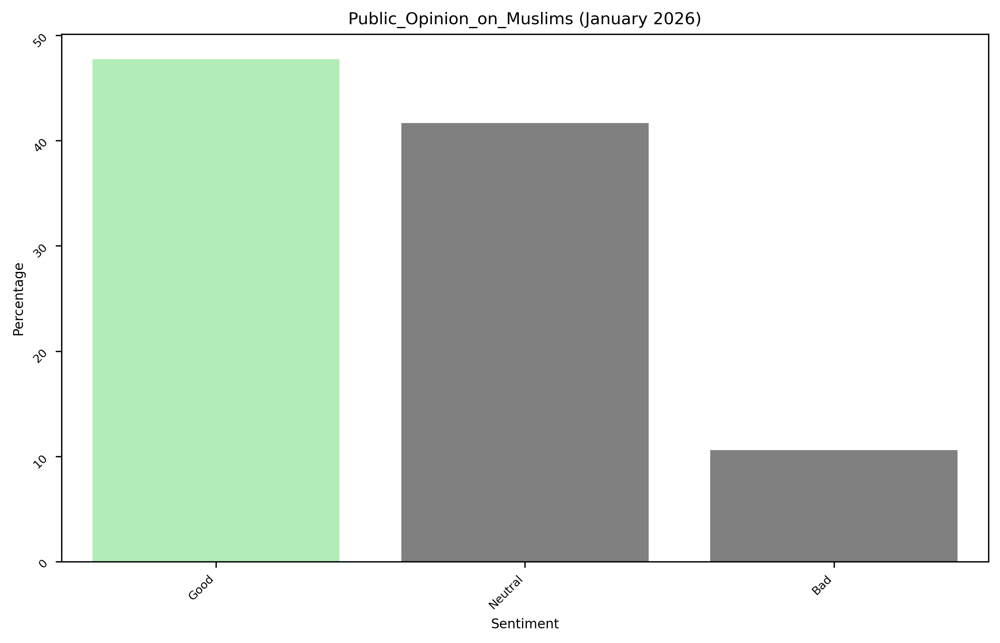

In [11]:
plot_percentages(jan26,
                 column_name='How do you feel about Muslim people in America?',
                 x_label='Sentiment',
                 title='Public_Opinion_on_Muslims (January 2026)')

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Comfort_levels_Around_Muslims_in_America_Jan_2026.png


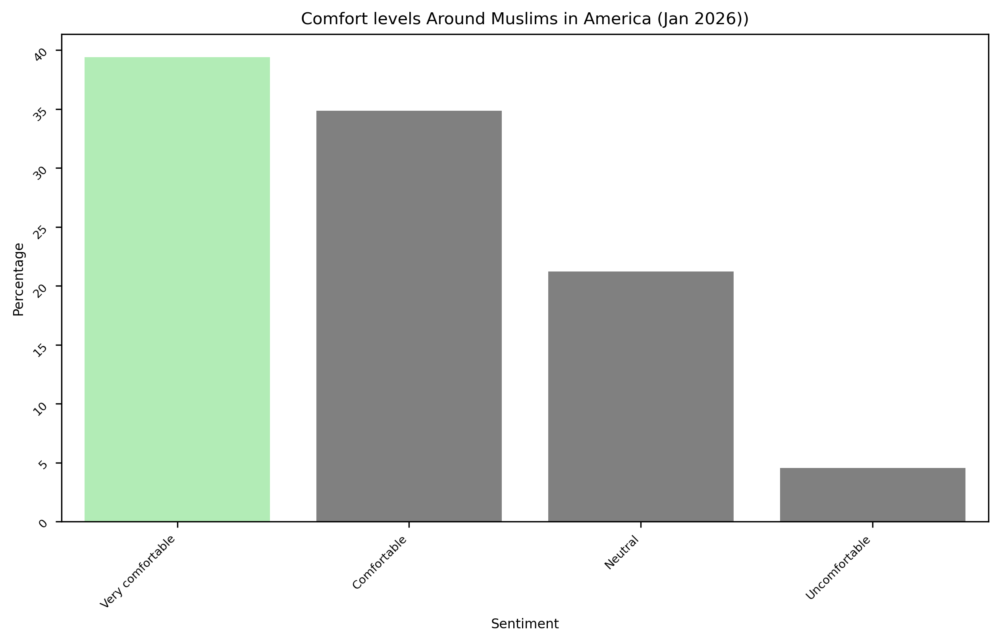

In [12]:
plot_percentages(jan26,
                 column_name='How comfortable do you feel interacting with Muslims in your community?',
                 x_label='Sentiment',
                 title='Comfort levels Around Muslims in America (Jan 2026))')

# Religion Vs. Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Distribution_of_Religion_January_2026.png


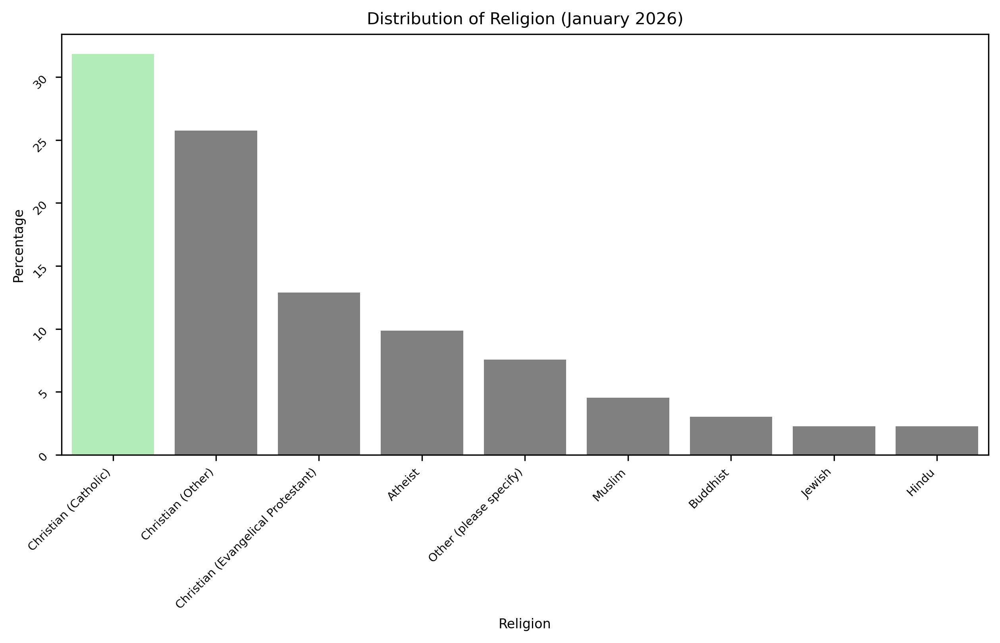

In [13]:
plot_percentages(jan26,
                 column_name='What is your religion?',
                 x_label='Religion',
                 title='Distribution of Religion (January 2026)')

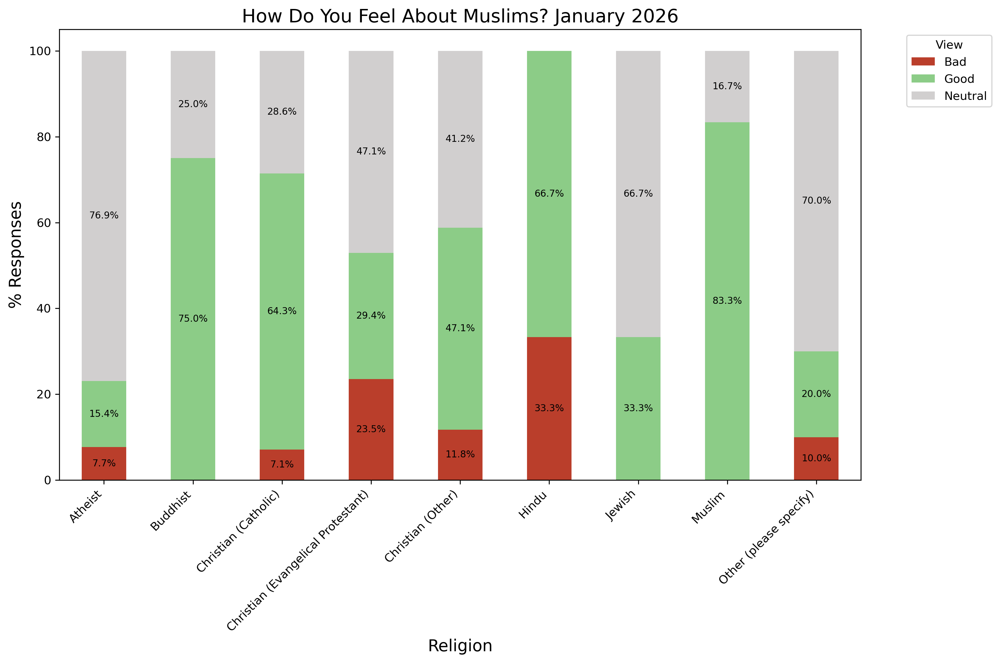

In [14]:
plot_stacked_bar_chart(jan26,
                       title='How Do You Feel About Muslims? January 2026',
                       xlabel='Religion',
                       ylabel='% Responses',
                       cat_col='What is your religion?',
                       sent_col='How do you feel about Muslim people in America?')

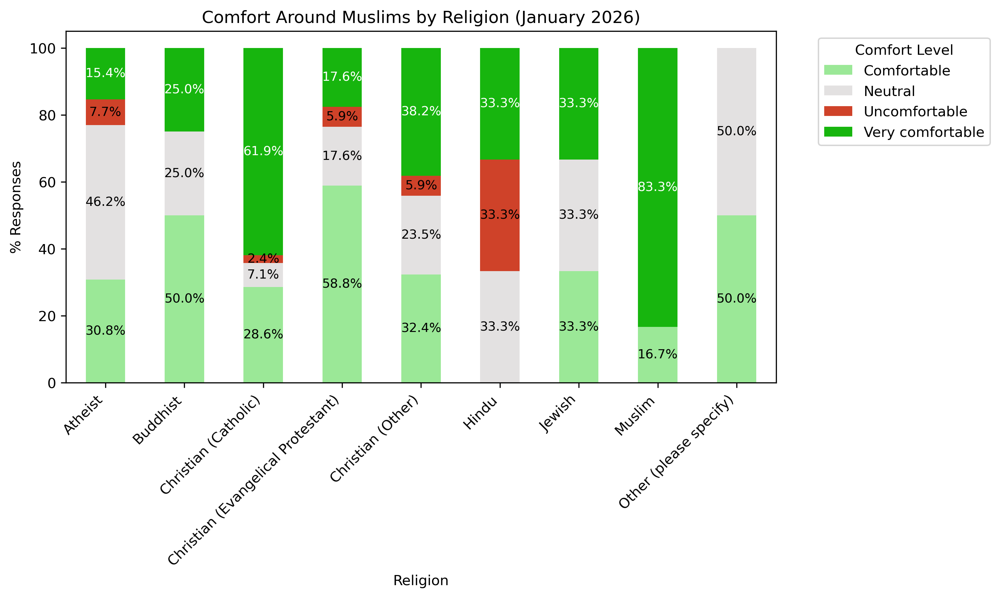

In [15]:
plot_comfort(jan26,
             category_col='What is your religion?',
             comfort_level='How comfortable do you feel interacting with Muslims in your community?',
             title='Comfort Around Muslims by Religion (January 2026)',
             xlabel='Religion',
             ylabel='% Responses')

# Gender Vs. Sentiment

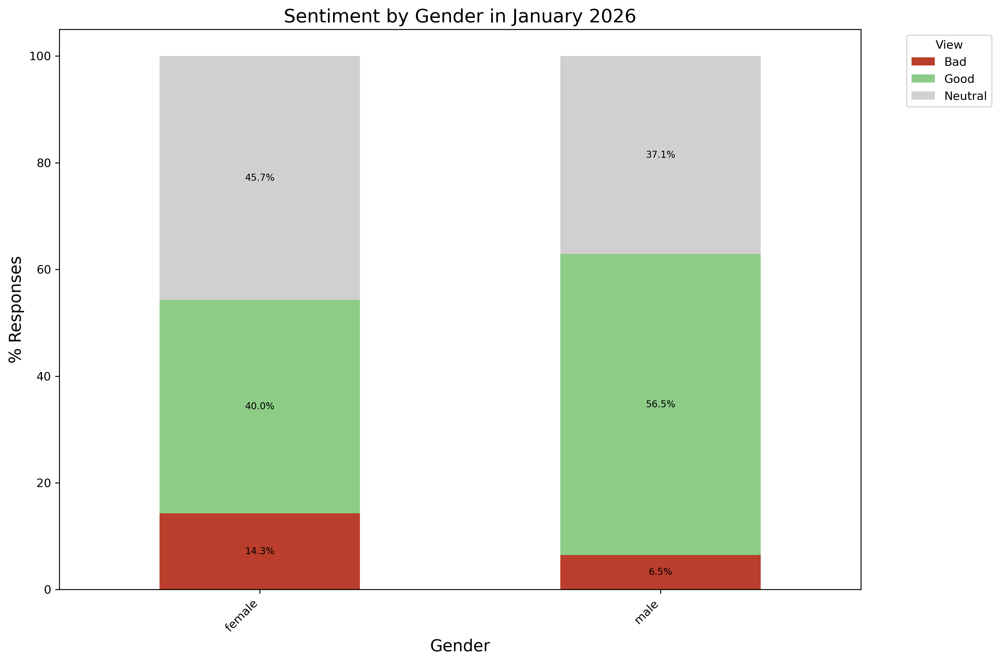

In [16]:
plot_stacked_bar_chart(jan26,
                       title='Sentiment by Gender in January 2026',
                       xlabel='Gender',
                       ylabel='% Responses',
                       cat_col='Gender',
                       sent_col='How do you feel about Muslim people in America?')

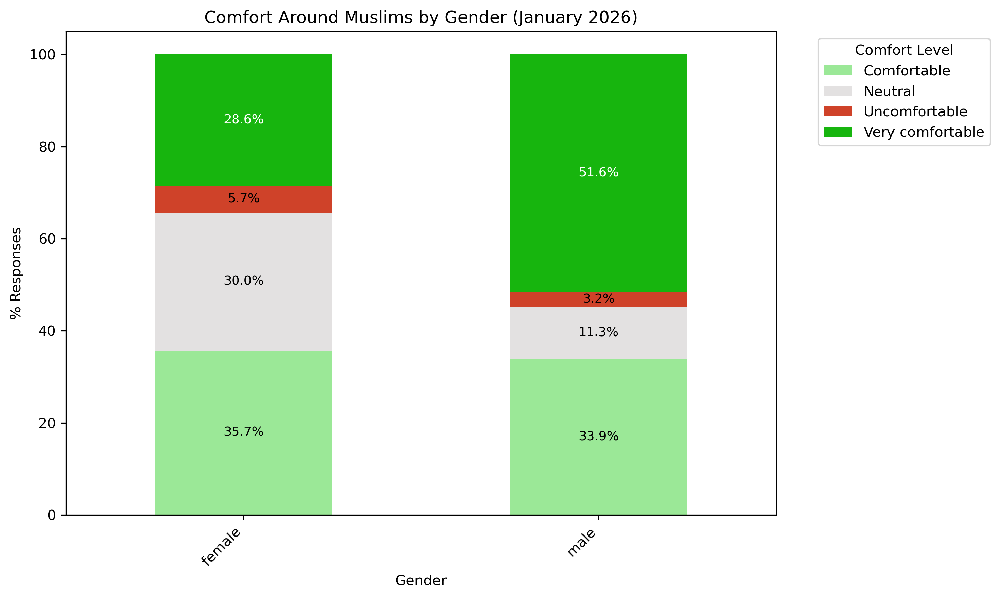

In [17]:
plot_comfort(jan26,
             category_col= 'Gender',
             comfort_level='How comfortable do you feel interacting with Muslims in your community?',
             title='Comfort Around Muslims by Gender (January 2026)',
             xlabel='Gender',
             ylabel='% Responses')

# Education Vs. Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/The_Majority_of_Those_Surveyed_Hold_Degrees_In_Higher_Education_January_2026.png


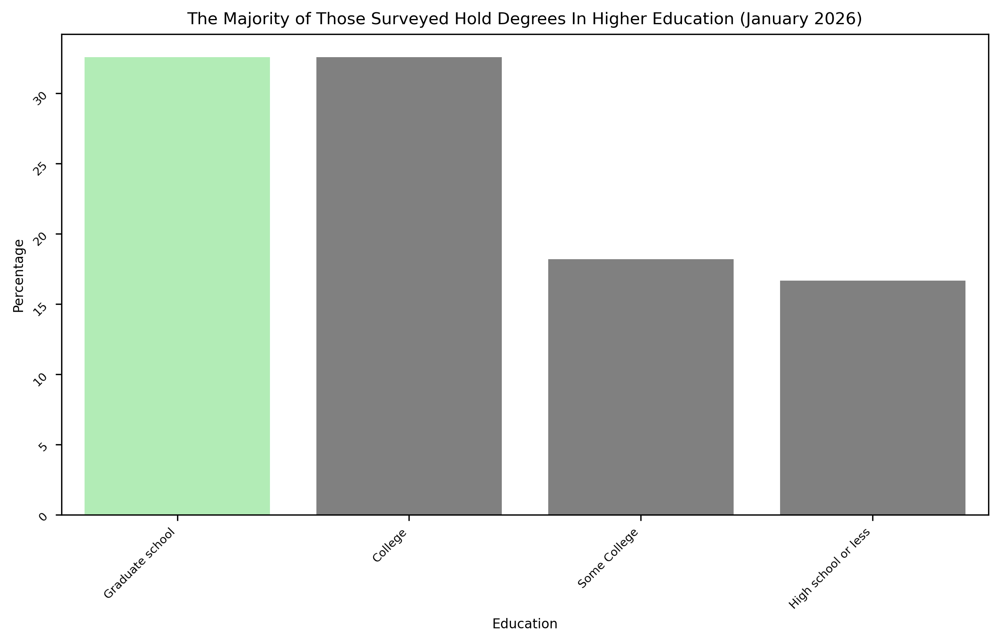

In [18]:
plot_percentages(jan26,'What is your level of education?', 'Education',
           'The Majority of Those Surveyed Hold Degrees In Higher Education (January 2026)')

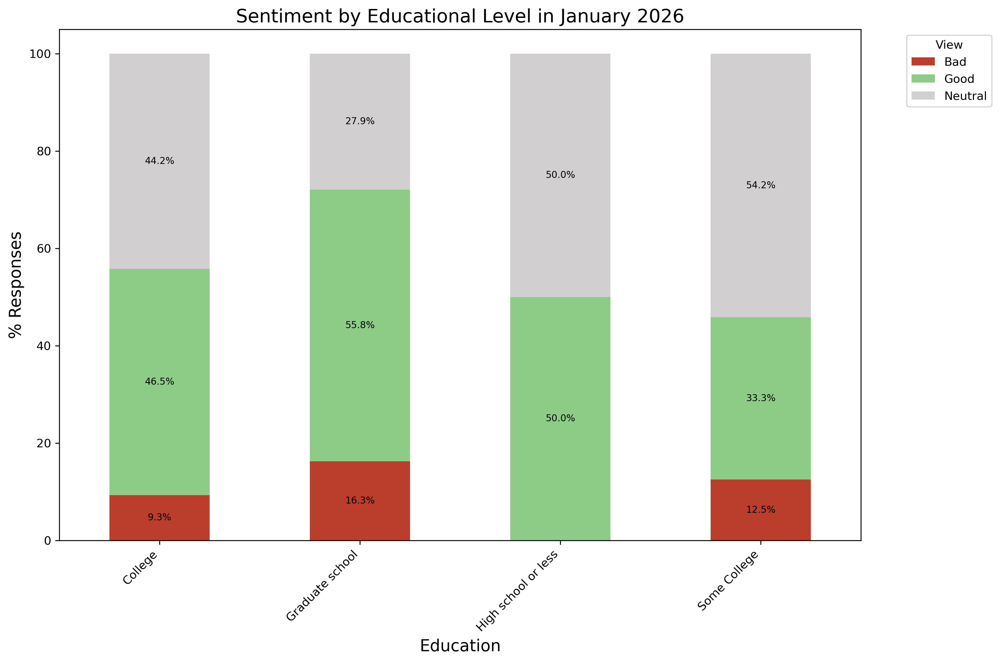

In [19]:
plot_stacked_bar_chart(jan26,
                       title='Sentiment by Educational Level in January 2026',
                       xlabel='Education',
                       ylabel='% Responses',
                       cat_col='What is your level of education?',
                       sent_col='How do you feel about Muslim people in America?')

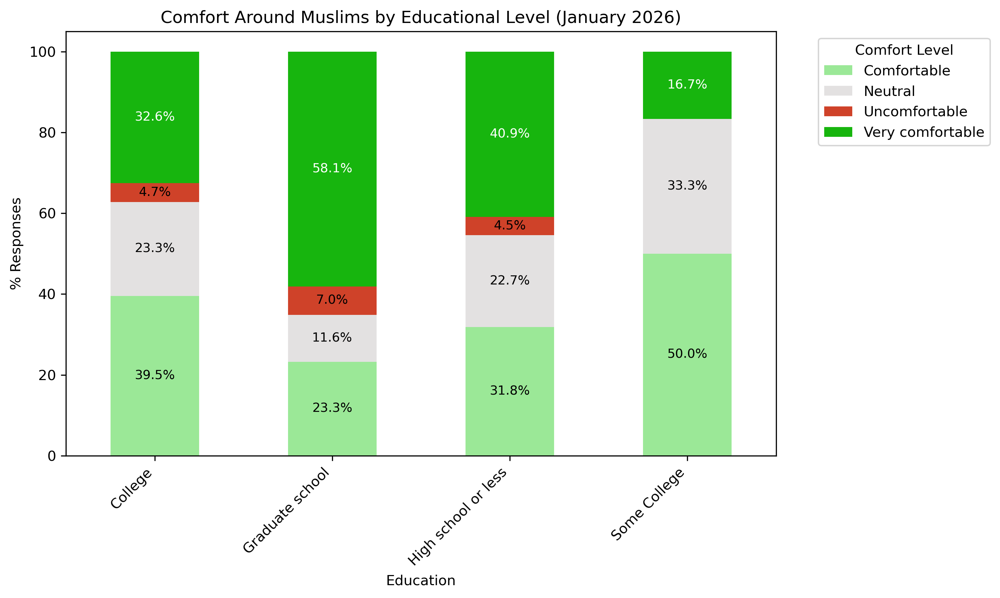

In [20]:
plot_comfort(jan26,
             category_col= 'What is your level of education?',
             comfort_level='How comfortable do you feel interacting with Muslims in your community?',
             title='Comfort Around Muslims by Educational Level (January 2026)',
             xlabel='Education',
             ylabel='% Responses')

# Age Vs. Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/~40%_Of_Survey_Partipants_are_aged_30-44_January_2026.png


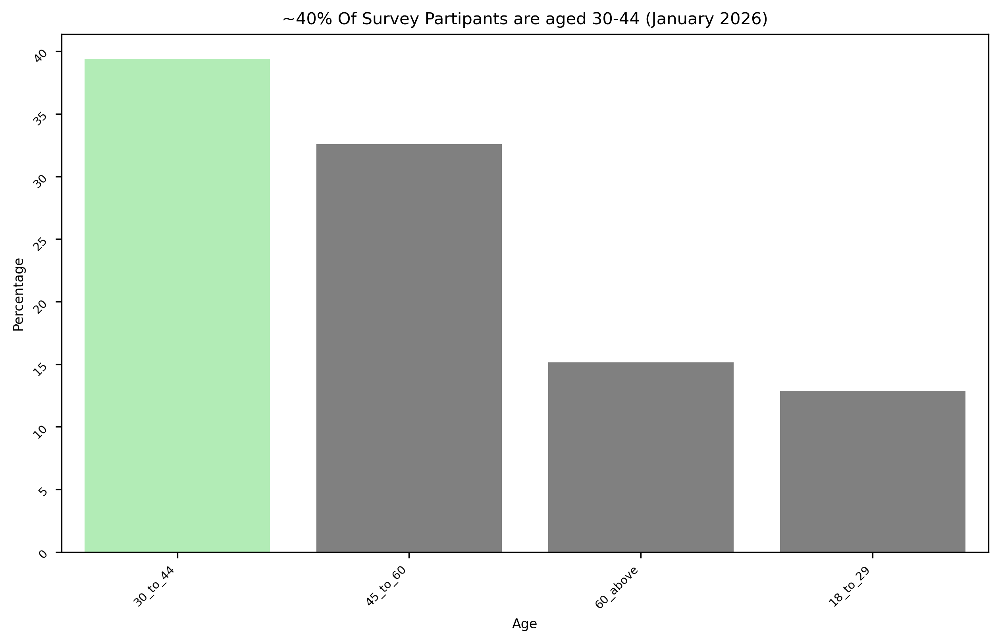

In [28]:
plot_percentages(jan26,'Age', 'Age',
           '~40% Of Survey Partipants are aged 30-44 (January 2026)')

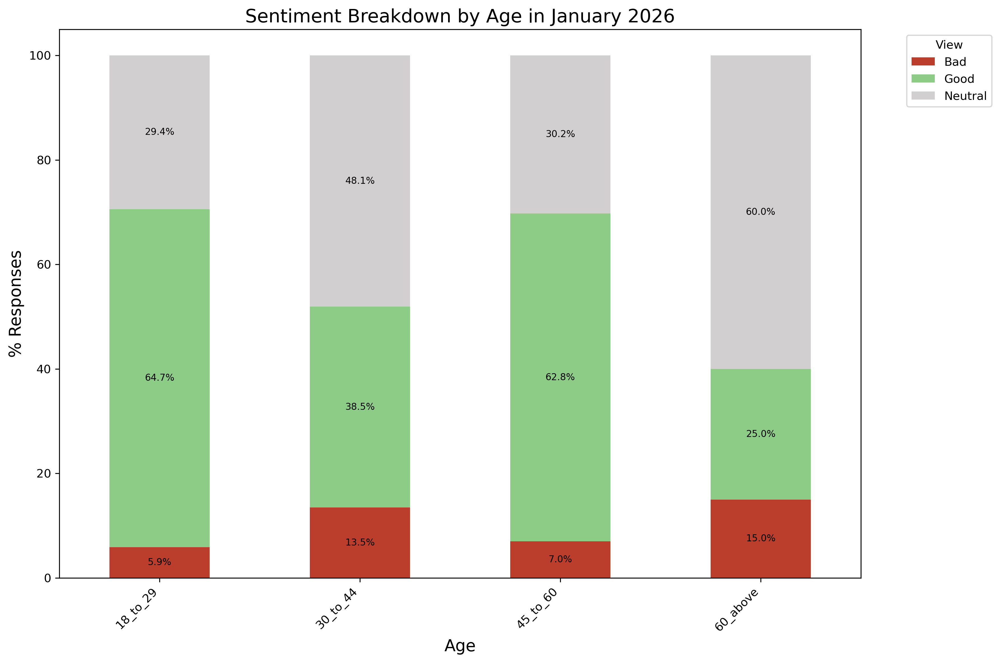

In [21]:
plot_stacked_bar_chart(jan26,
                       title='Sentiment Breakdown by Age in January 2026',
                       xlabel='Age',
                       ylabel='% Responses',
                       cat_col='Age',
                       sent_col='How do you feel about Muslim people in America?')

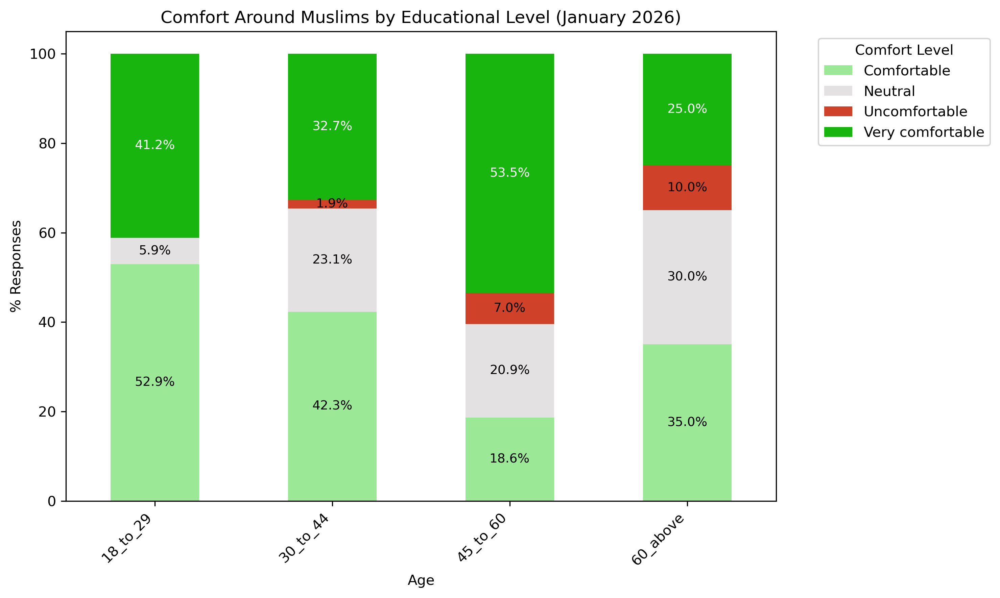

In [22]:
plot_comfort(jan26,
             category_col= 'Age',
             comfort_level='How comfortable do you feel interacting with Muslims in your community?',
             title='Comfort Around Muslims by Educational Level (January 2026)',
             xlabel='Age',
             ylabel='% Responses')

# Income Vs. Sentiment

In [23]:
income_mapping = {"25000_to_49999": "25k-49k",
"50000_to_74999":"50k-74k",
"75000_to_99999": "75k-99k",
"125000_to_149999": "125k-149k",
"100000_to_124999" :"100k-124k",
"0_to_9999"        : "0-9k",
"no_answer":    "undisclosed",
"150000_to_174999":"150k-174k",
"10000_to_24999" : "10k-24k",
"200000_and_up":   "200k_up",
"175000_to_199999": "175k-199k"}

jan26['Household Income']= jan26['Household Income'].replace(income_mapping)

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Most_Survey_Respondents_Are_Upper_Middle_Class_Earners.png


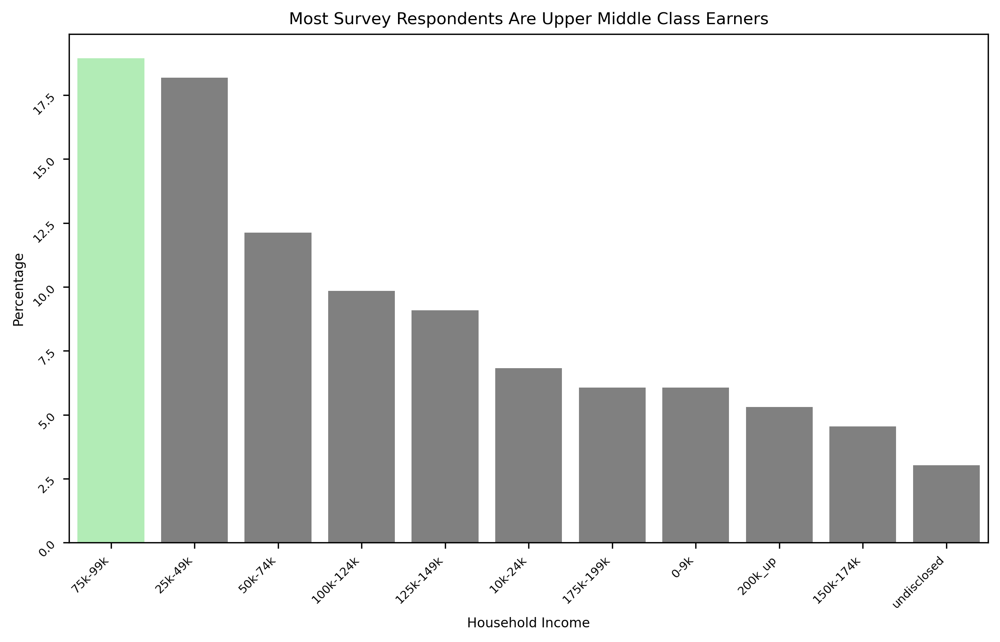

In [24]:
plot_percentages(jan26,'Household Income', 'Household Income',
           'Most Survey Respondents Are Upper Middle Class Earners')

In [25]:
income_brackets = { "25k-49k":'low',
"50k-74k":"mid",
"75k-99k":"mid",
"125k-149k":"mid",
"100k-124k":"mid",
 "0-9k":"low",
"undisclosed":"undisclosed",
"150k-174k":"high",
"10k-24k":"low",
 "200k_up":"high",
"175k-199k":"high"}

In [26]:
jan26['Household_Income'] = jan26['Household Income'].replace(income_brackets)

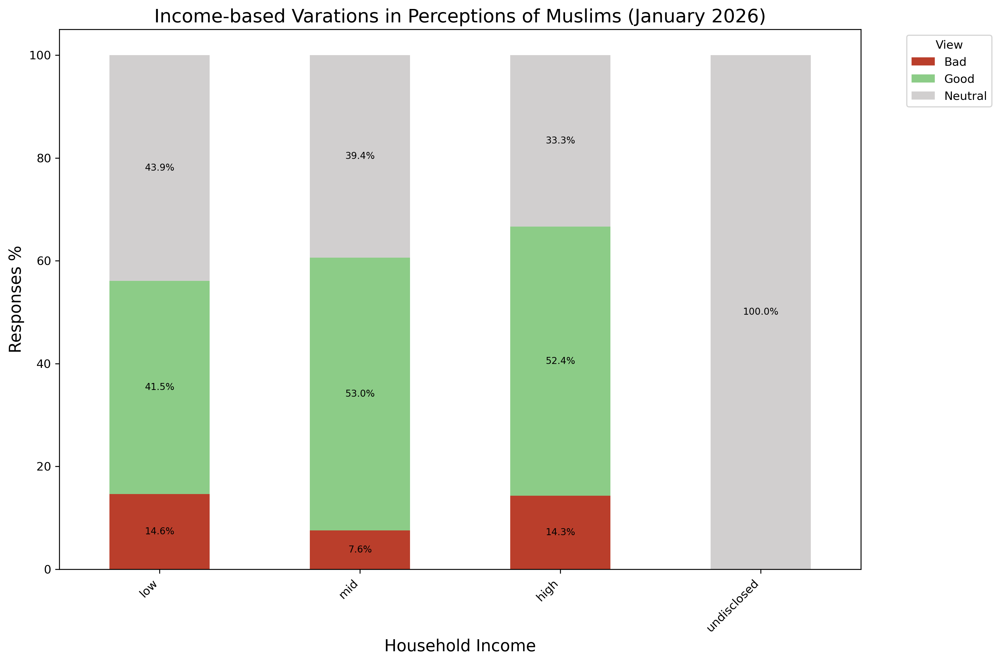

In [27]:
order = ['low','mid','high', 'undisclosed']

plot_income(
    df=jan26, 
    title='Income-based Varations in Perceptions of Muslims (January 2026)',
    xlabel='Household Income',
    ylabel='Responses %',
    cat_col='Household_Income',
    sent_col='How do you feel about Muslim people in America?',
    cat_order=order
)

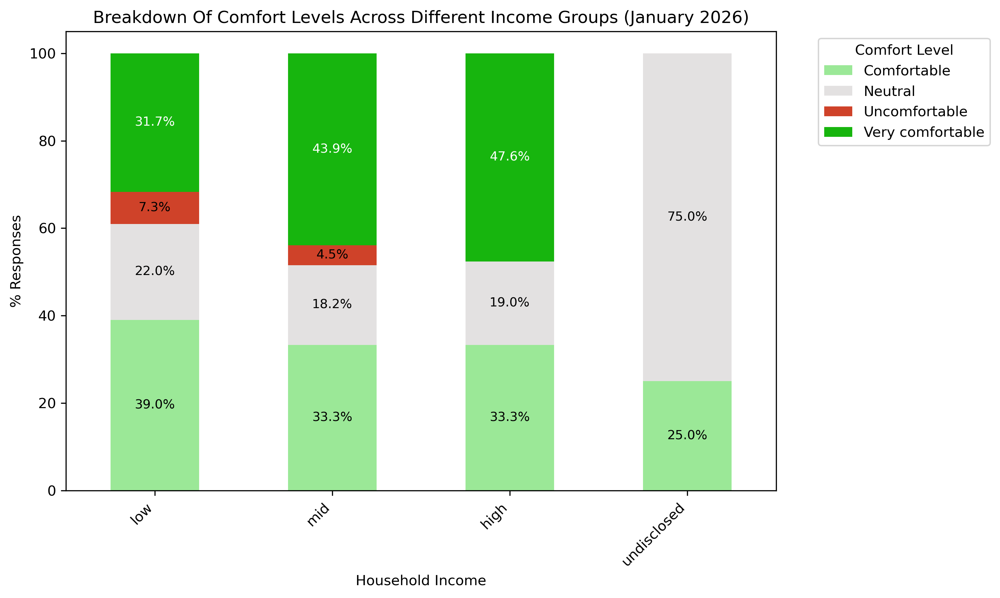

In [28]:
plot_comfort(
    df= jan26, 
    category_col= 'Household_Income',
    comfort_level = 'How comfortable do you feel interacting with Muslims in your community?',
    title='Breakdown Of Comfort Levels Across Different Income Groups (January 2026)',
    xlabel='Household Income',
    ylabel='% Responses',
)

# Region Vs Sentiment and Comfort

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Strong_Regional_Imbalance_-_Pacific_and_Middle_Atlantic_Account_For_~_45%.png


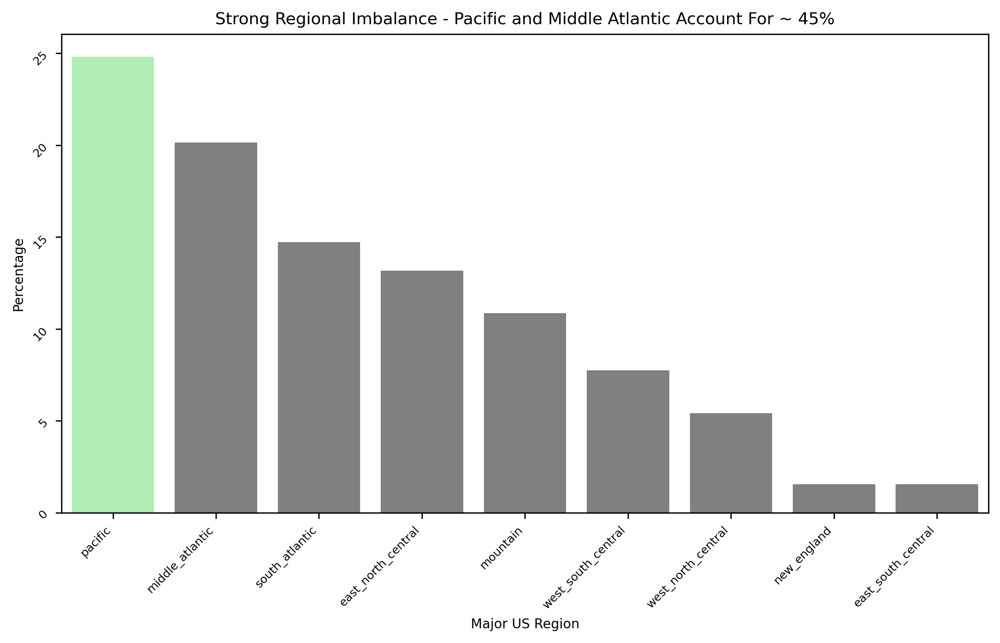

In [29]:
plot_percentages(jan26,'Major US Region', 'Major US Region',
                 'Strong Regional Imbalance - Pacific and Middle Atlantic Account For ~ 45%')

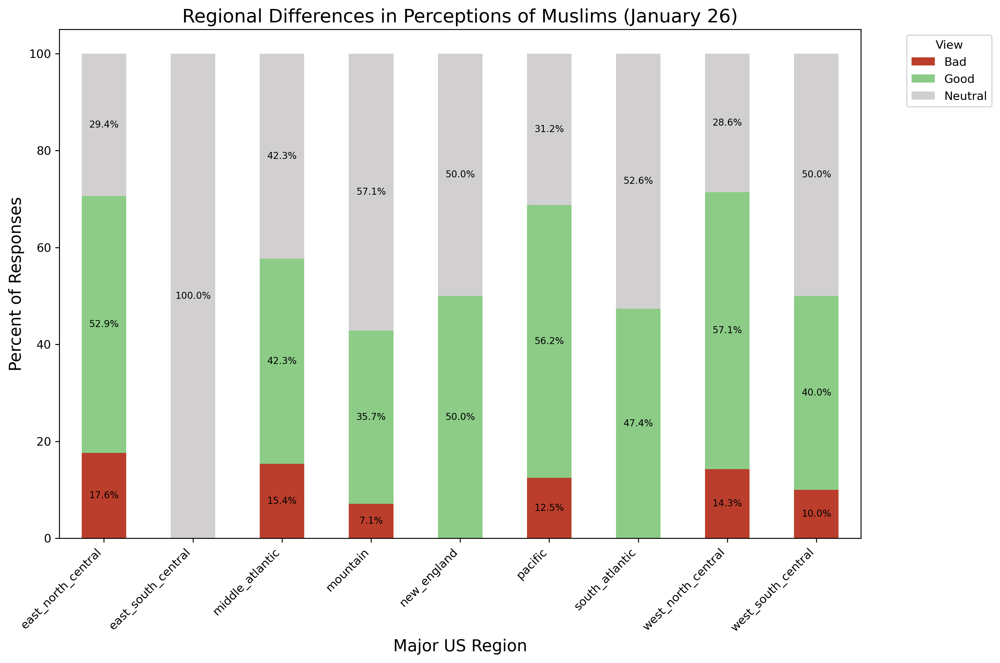

In [30]:
plot_stacked_bar_chart(
    df=jan26, 
    title='Regional Differences in Perceptions of Muslims (January 26)',
    xlabel='Major US Region',
    ylabel='Percent of Responses',
    cat_col='Major US Region',
    sent_col='How do you feel about Muslim people in America?'
)

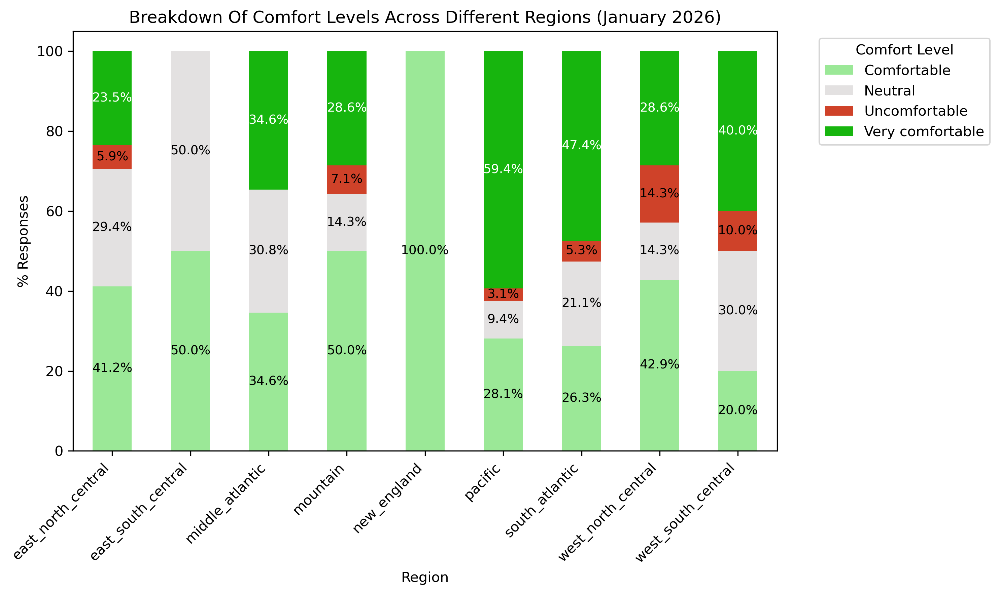

In [31]:
plot_comfort(
    df= jan26, 
    category_col= 'Major US Region',
    comfort_level = 'How comfortable do you feel interacting with Muslims in your community?',
    title='Breakdown Of Comfort Levels Across Different Regions (January 2026)',
    xlabel='Region',
    ylabel='% Responses',
)

# Relationship Between Knowing a Muslim and Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Close_to_~50%_Of_Respondents_Have_Not_Spoken_to_Any_Muslims_In_The_Last_7_Days_January_26.png


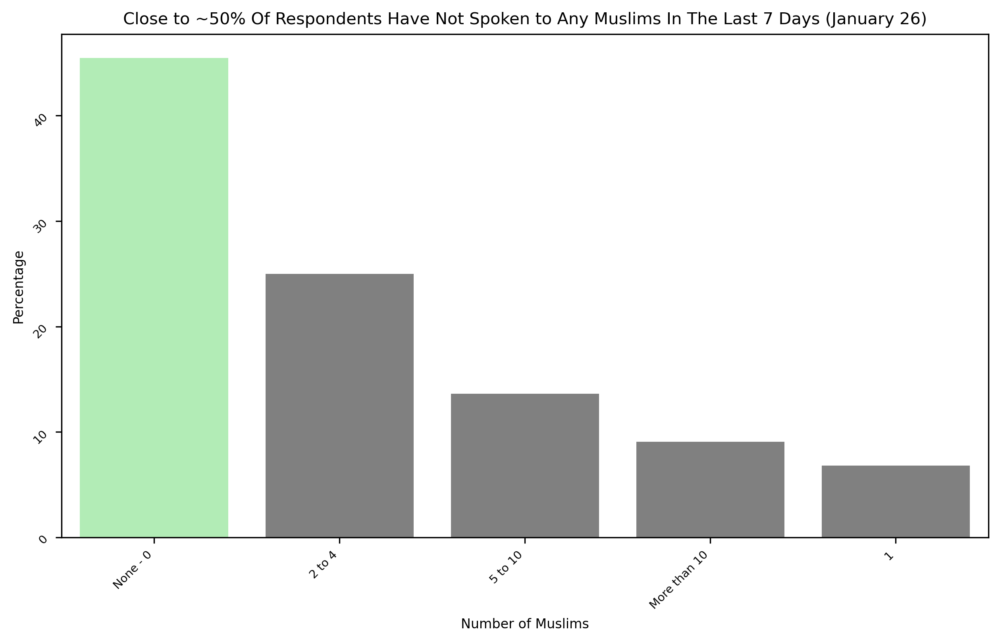

In [32]:
plot_percentages(jan26,'How many Muslim people have you talked to in the last 7 days?', 'Number of Muslims',\
           'Close to ~50% Of Respondents Have Not Spoken to Any Muslims In The Last 7 Days (January 26)')

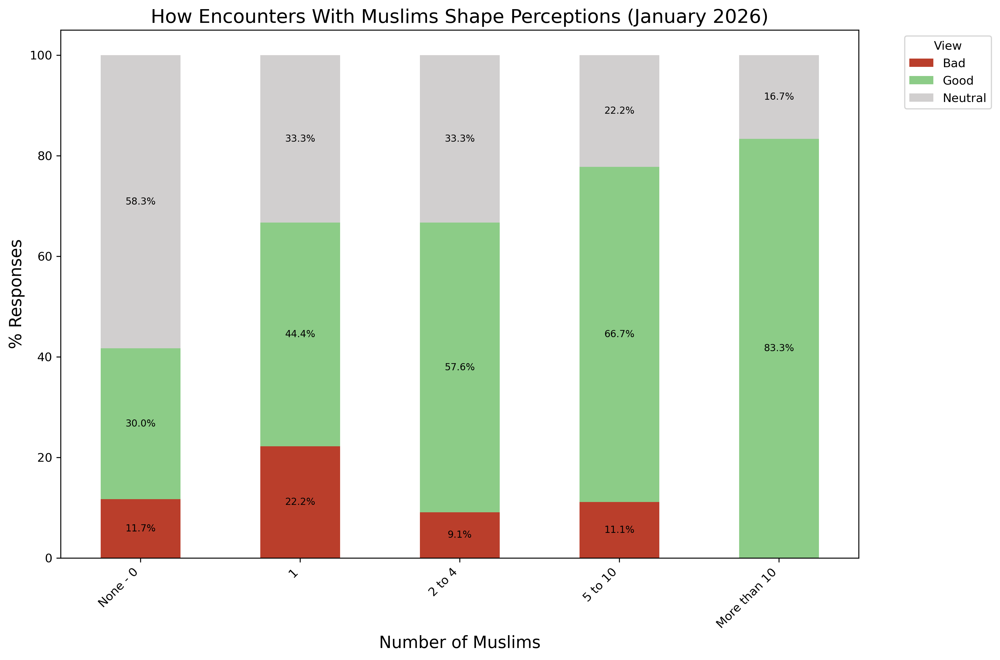

<Figure size 7200x4000 with 0 Axes>

In [33]:
plot_stacked_bar_chart_interaction(
    df=jan26, 
    title='How Encounters With Muslims Shape Perceptions (January 2026)',
    xlabel='Number of Muslims',
    ylabel='% Responses',
    cat_col='How many Muslim people have you talked to in the last 7 days?',
    sent_col='How do you feel about Muslim people in America?'
)

In [34]:
jan26_non_muslim = jan26[jan26['What is your religion?'] != 'Muslim']

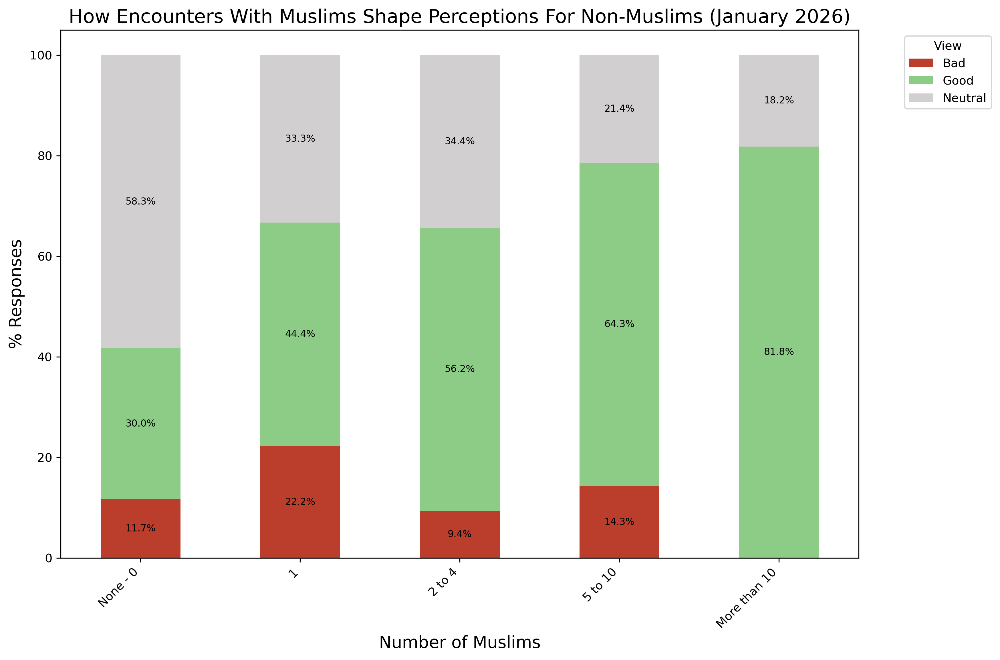

<Figure size 7200x4000 with 0 Axes>

In [35]:
plot_stacked_bar_chart_interaction(
    df=jan26_non_muslim, 
    title='How Encounters With Muslims Shape Perceptions For Non-Muslims (January 2026)',
    xlabel='Number of Muslims',
    ylabel='% Responses',
    cat_col='How many Muslim people have you talked to in the last 7 days?',
    sent_col='How do you feel about Muslim people in America?'
)

<Axes: xlabel='How many Muslim people have you talked to in the last 7 days?'>

Text(0.5, 1.0, "Number of Interactions With Muslims in The Last 7 Days by Respondent's Religion (January 2026)")

Text(0.5, 0, 'Number of Muslim People Talked To')

Text(0, 0.5, 'Percentage of Respondents')

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, '1'),
  Text(1, 0, '2 to 4'),
  Text(2, 0, '5 to 10'),
  Text(3, 0, 'More than 10'),
  Text(4, 0, 'None - 0')])

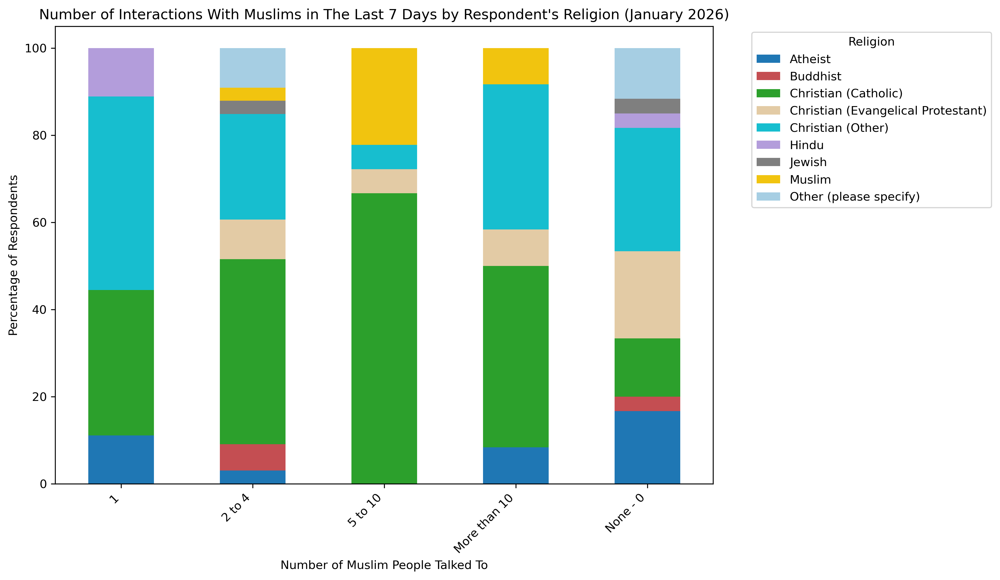

In [36]:
import matplotlib.pyplot as plt

counts = jan26.groupby(['How many Muslim people have you talked to in the last 7 days?', 
                        'What is your religion?']).size().unstack()

# Convert counts to percentages
percentages = counts.div(counts.sum(axis=1), axis=0) * 100

# Plotting
percentages.plot(kind='bar', stacked=True, figsize=(10, 7), \
                 color = ['#1f77b4', '#c44e52', '#2ca02c', '#e3cba5', '#17becf',
          '#b39ddb', '#7f7f7f', '#f1c40f', '#a6cee3', '#e7969c']

)

plt.title("Number of Interactions With Muslims in The Last 7 Days by Respondent's Religion (January 2026)")
plt.xlabel("Number of Muslim People Talked To")
plt.ylabel("Percentage of Respondents")
plt.xticks(rotation=45, ha='right') 

plt.legend(title="Religion", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

<Axes: xlabel='How many Muslim people have you talked to in the last 7 days?'>

Text(0.5, 1.0, "Number of Interactions With Muslims in The Last 7 Days by Respondent's Age (January 2025)")

Text(0.5, 0, 'Number of Muslim People Talked To')

Text(0, 0.5, 'Percentage of Respondents')

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, '1'),
  Text(1, 0, '2 to 4'),
  Text(2, 0, '5 to 10'),
  Text(3, 0, 'More than 10'),
  Text(4, 0, 'None - 0')])

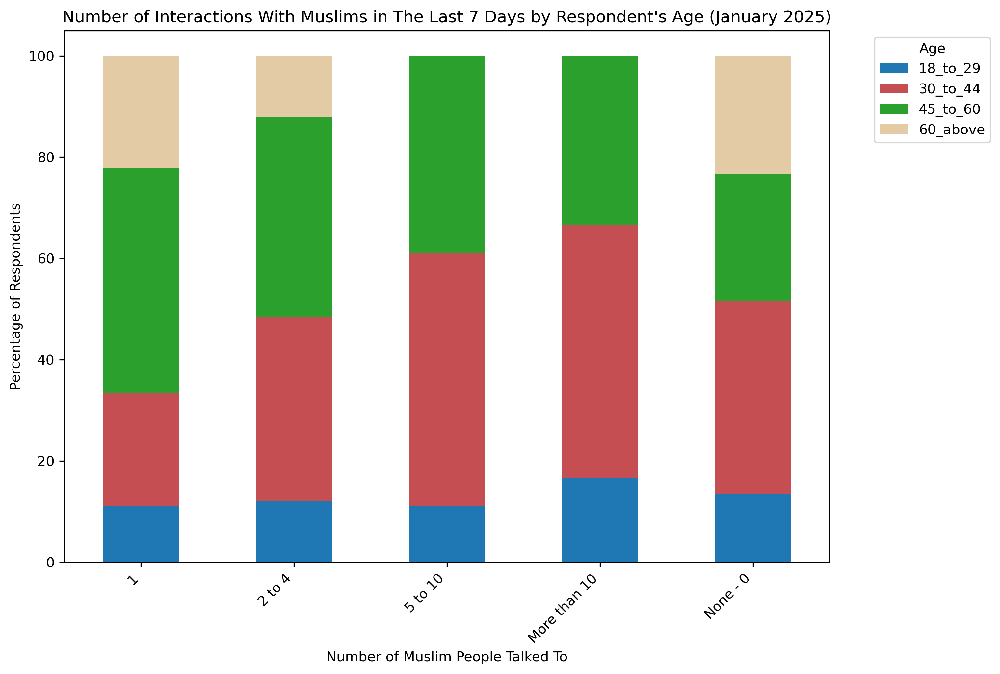

In [37]:
counts = jan26.groupby(['How many Muslim people have you talked to in the last 7 days?', 
                        'Age']).size().unstack()

# Convert counts to percentages
percentages = counts.div(counts.sum(axis=1), axis=0) * 100

# Plotting
percentages.plot(kind='bar', stacked=True, figsize=(10, 7), \
                 color = ['#1f77b4', '#c44e52', '#2ca02c', '#e3cba5', '#17becf',
          '#b39ddb', '#7f7f7f', '#f1c40f', '#a6cee3', '#e7969c']

)

plt.title("Number of Interactions With Muslims in The Last 7 Days by Respondent's Age (January 2025)")
plt.xlabel("Number of Muslim People Talked To")
plt.ylabel("Percentage of Respondents")
plt.xticks(rotation=45, ha='right') 

plt.legend(title="Age", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

# News Source Vs. Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/News_Source_Distribution_January_2026.png


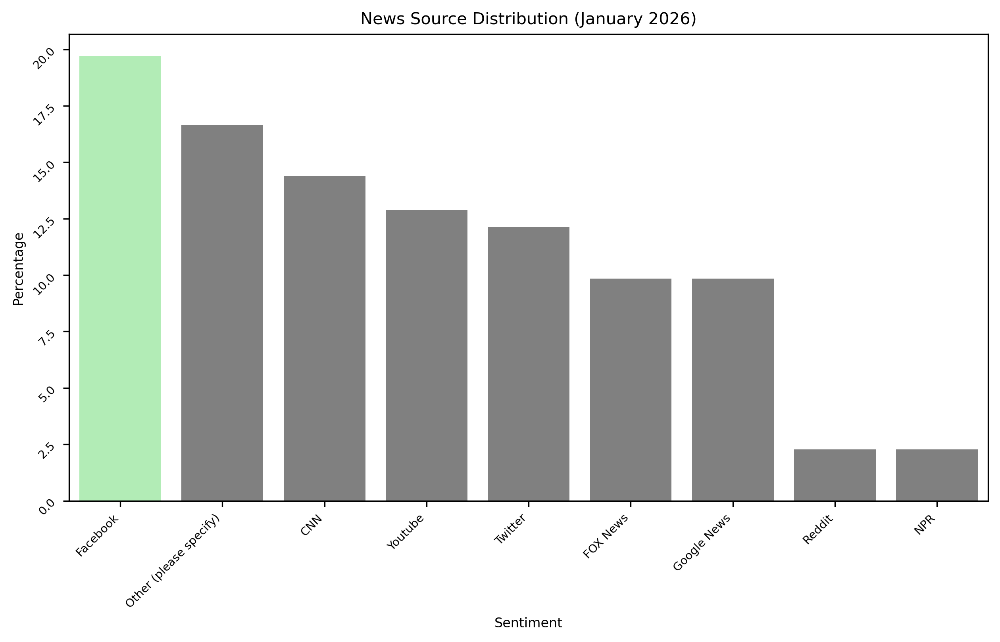

In [38]:
plot_percentages(jan26,
                 column_name='Where do you get your news from?',
                 x_label='Sentiment',
                 title='News Source Distribution (January 2026)')

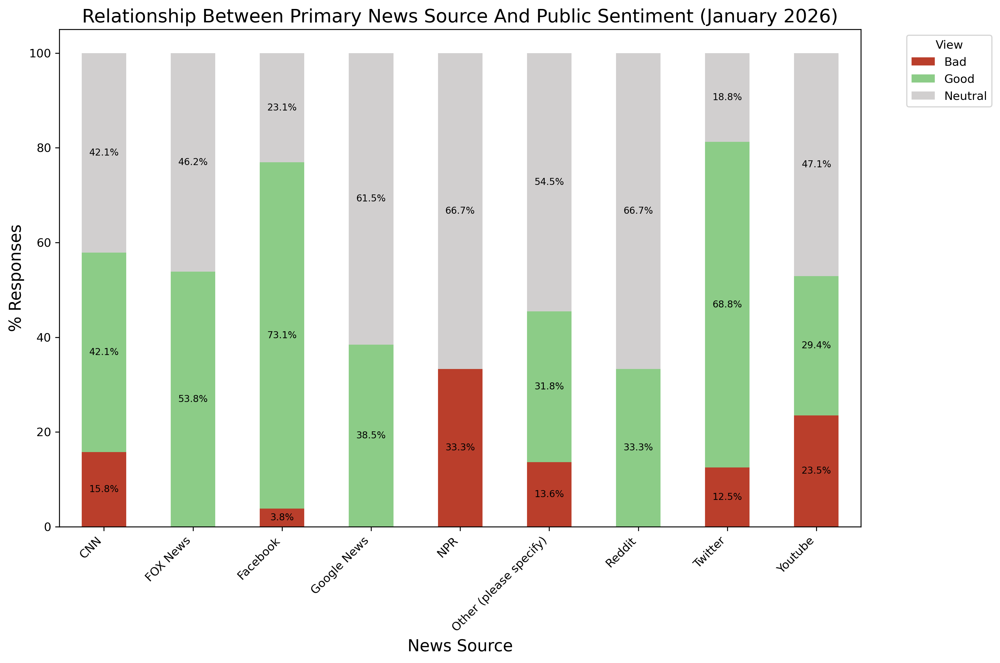

In [39]:
plot_stacked_bar_chart(
    df=jan26, 
    title='Relationship Between Primary News Source And Public Sentiment (January 2026)',
    xlabel='News Source',
    ylabel='% Responses',
    cat_col= 'Where do you get your news from?',
    sent_col='How do you feel about Muslim people in America?'
)

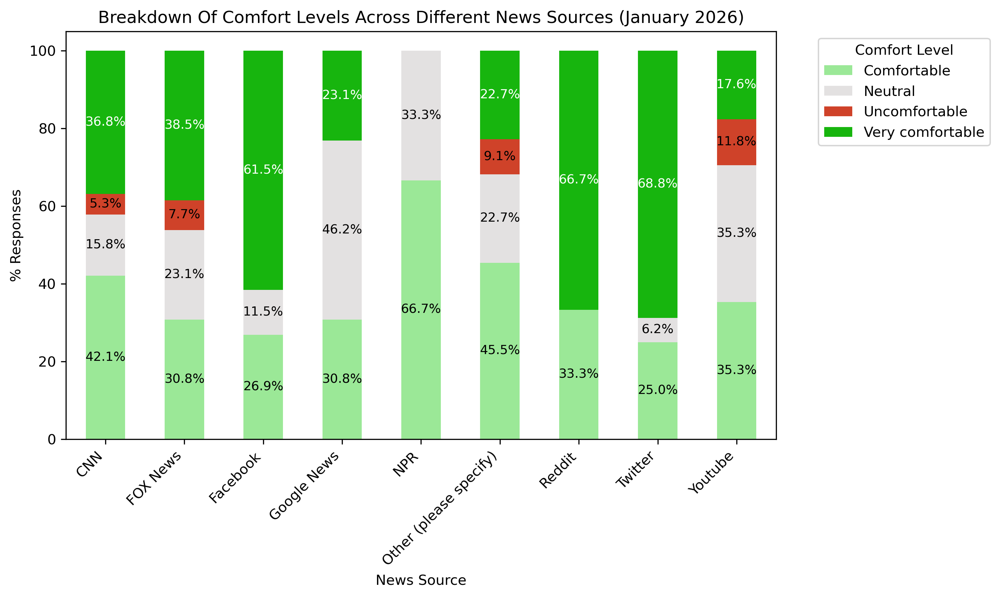

In [40]:
plot_comfort(
    df= jan26, 
    category_col= 'Where do you get your news from?',
    comfort_level = 'How comfortable do you feel interacting with Muslims in your community?',
    title='Breakdown Of Comfort Levels Across Different News Sources (January 2026)',
    xlabel='News Source',
    ylabel='% Responses',
)

## Relationship Between Exposure to Positive Portrayal and Overall Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Less_than_35%_Of_Respondents_Reported_Seeing_Positive_Stories_About_Muslims_in_the_Media_January_2026.png


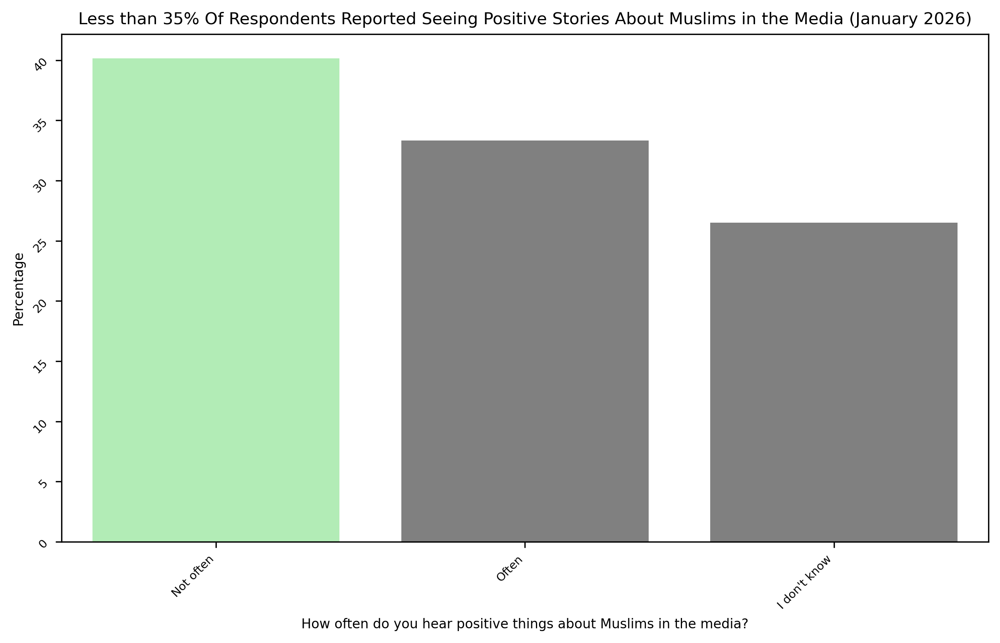

In [41]:
plot_percentages(jan26,'How often do you hear positive things about Muslims in the media?', 'How often do you hear positive things about Muslims in the media?',
           'Less than 35% Of Respondents Reported Seeing Positive Stories About Muslims in the Media (January 2026)')

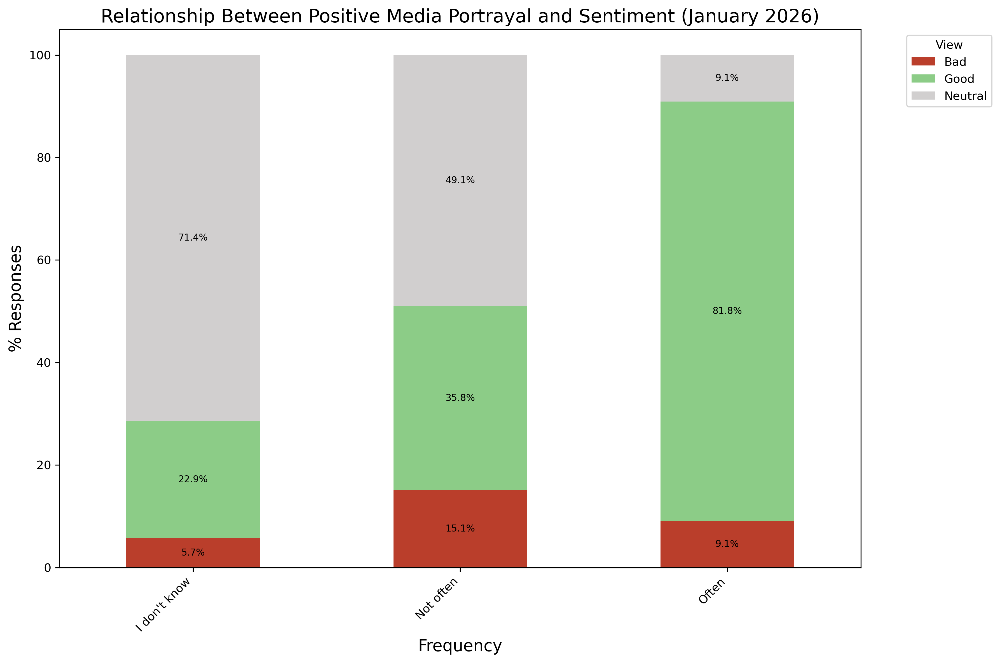

In [42]:
plot_stacked_bar_chart(
    df=jan26, 
    title='Relationship Between Positive Media Portrayal and Sentiment (January 2026)',
    xlabel='Frequency',
    ylabel='% Responses',
    cat_col= 'How often do you hear positive things about Muslims in the media?',
    sent_col='How do you feel about Muslim people in America?'
)

In [64]:
pd.crosstab(
    jan26['Where do you get your news from?'],
    jan26['How often do you hear positive things about Muslims in the media?']
)

How often do you hear positive things about Muslims in the media?,I don't know,Not often,Often
Where do you get your news from?,,,
CNN,5,6,8
FOX News,2,6,5
Facebook,5,6,15
Google News,6,6,1
NPR,1,2,0
Other (please specify),8,13,1
Reddit,2,0,1
Twitter,0,6,10
Youtube,6,8,3


In [67]:
jan26[jan26['Where do you get your news from?']=='Other (please specify)']

,Start Date,End Date,What is your religion?,Religion_other,How many Muslim people have you talked to in the last 7 days?,How do you feel about Muslim people in America?,What is your level of education?,Where do you get your news from?,News_other,How comfortable do you feel interacting with Muslims in your community?,...,"How would you rate your own understanding of Muslim religious practices (e.g., Ramadan, daily prayers)?",Do you feel you have a lot in common with Muslims in America?,"If you had questions about Islam or Muslims, where would you go to learn more?",Have you ever changed your opinion about a group of people after getting to know someone personally,Have you ever been helped by a Muslim?,Gender,Age,Major US Region,Household Income,Household_Income
1,01/10/2026 12:02:29 AM,01/10/2026 12:04:05 AM,Christian (Other),NaN,None - 0,Good,College,Other (please specify),MS Now,Very comfortable,...,A little,Yes,Internet,Yes,No,female,60_above,south_atlantic,125k-149k,mid
7,01/10/2026 12:00:57 AM,01/10/2026 12:03:30 AM,Other (please specify),Methodist,None - 0,Neutral,College,Other (please specify),Local & World News,Neutral,...,None at all,No,Internet,Not sure,No,female,60_above,south_atlantic,10k-24k,low
40,01/09/2026 09:03:58 PM,01/09/2026 09:05:12 PM,Christian (Catholic),NaN,None - 0,Bad,Graduate school,Other (please specify),Resources,Uncomfortable,...,None at all,No,I wouldn't seek info,No,No,male,45_to_60,west_south_central,50k-74k,mid
41,01/09/2026 08:59:37 PM,01/09/2026 09:01:53 PM,Atheist,NaN,None - 0,Neutral,Some College,Other (please specify),BBC,Comfortable,...,A little,Yes,Internet,No,Yes,female,60_above,mountain,25k-49k,low
48,01/09/2026 08:21:32 PM,01/09/2026 08:23:25 PM,Christian (Other),NaN,None - 0,Good,College,Other (please specify),NBC News,Comfortable,...,A little,Yes,I wouldn't seek info,No,Yes,female,60_above,mountain,25k-49k,low
52,01/09/2026 07:55:36 PM,01/09/2026 07:57:53 PM,Christian (Catholic),NaN,1,Neutral,College,Other (please specify),local news stations like CBS,Very comfortable,...,A moderate amount,No,Internet,No,No,female,60_above,east_north_central,75k-99k,mid
66,01/09/2026 05:27:52 PM,01/09/2026 06:41:25 PM,Christian (Evangelical Protestant),NaN,None - 0,Bad,Graduate school,Other (please specify),Not the Bee,Comfortable,...,A moderate amount,No,Religious Leaders,Not sure,No,male,30_to_44,middle_atlantic,25k-49k,low
69,01/09/2026 06:26:48 PM,01/09/2026 06:28:59 PM,Christian (Other),NaN,None - 0,Good,College,Other (please specify),Internet,Very comfortable,...,None at all,Not sure,Internet,Not sure,Yes,female,45_to_60,west_south_central,50k-74k,mid
71,01/09/2026 06:21:28 PM,01/09/2026 06:23:10 PM,Christian (Other),NaN,None - 0,Neutral,College,Other (please specify),Many different sources,Comfortable,...,None at all,Not sure,I wouldn't seek info,Yes,Yes,female,30_to_44,west_north_central,100k-124k,mid
76,01/09/2026 06:00:33 PM,01/09/2026 06:03:10 PM,Christian (Other),NaN,None - 0,Neutral,High school or less,Other (please specify),I watch multiple sources and form my own opinion,Very comfortable,...,A great deal,No,Internet,No,Yes,male,30_to_44,pacific,125k-149k,mid


## Relationship Between Gender and Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/55%_of_the_Survey_Participants_Were_Women_January_2026.png


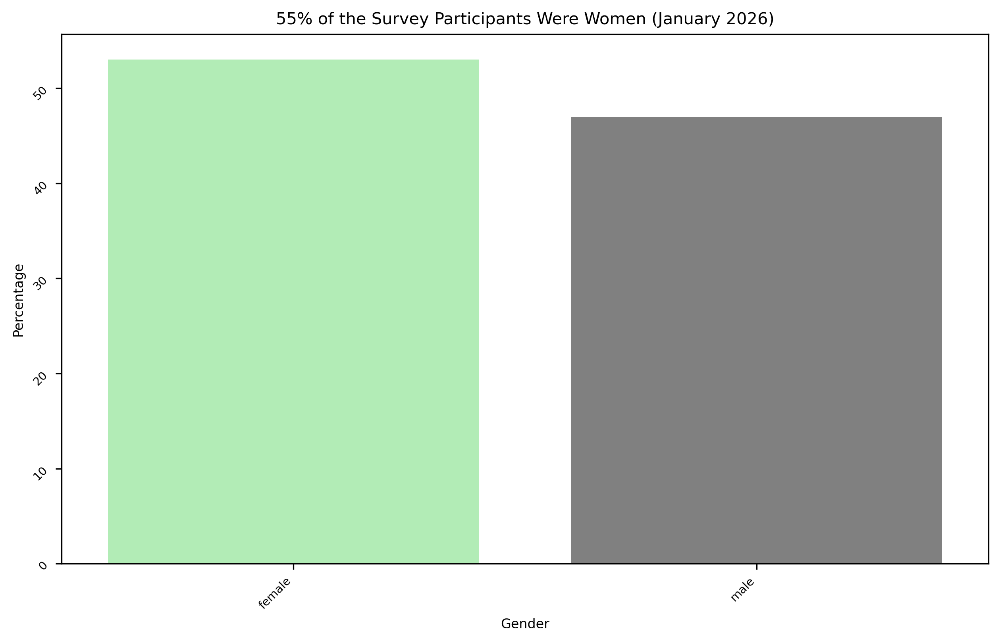

In [68]:
plot_percentages(jan26,'Gender', 'Gender',
           '55% of the Survey Participants Were Women (January 2026)')

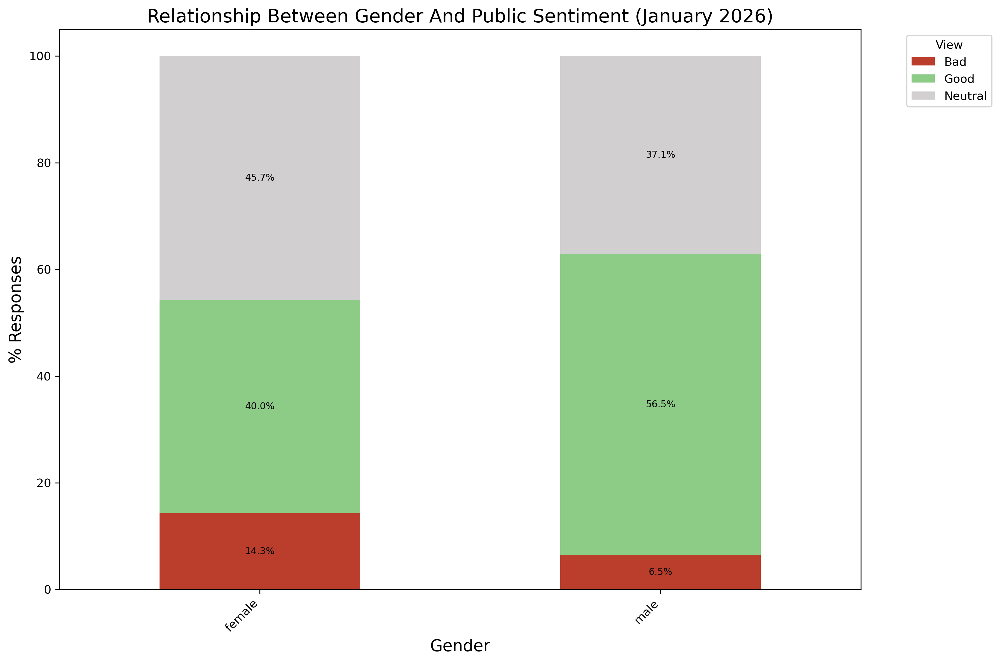

In [69]:
plot_stacked_bar_chart(
    df=jan26, 
    title='Relationship Between Gender And Public Sentiment (January 2026)',
    xlabel='Gender',
    ylabel='% Responses',
    cat_col= 'Gender',
    sent_col='How do you feel about Muslim people in America?'
)

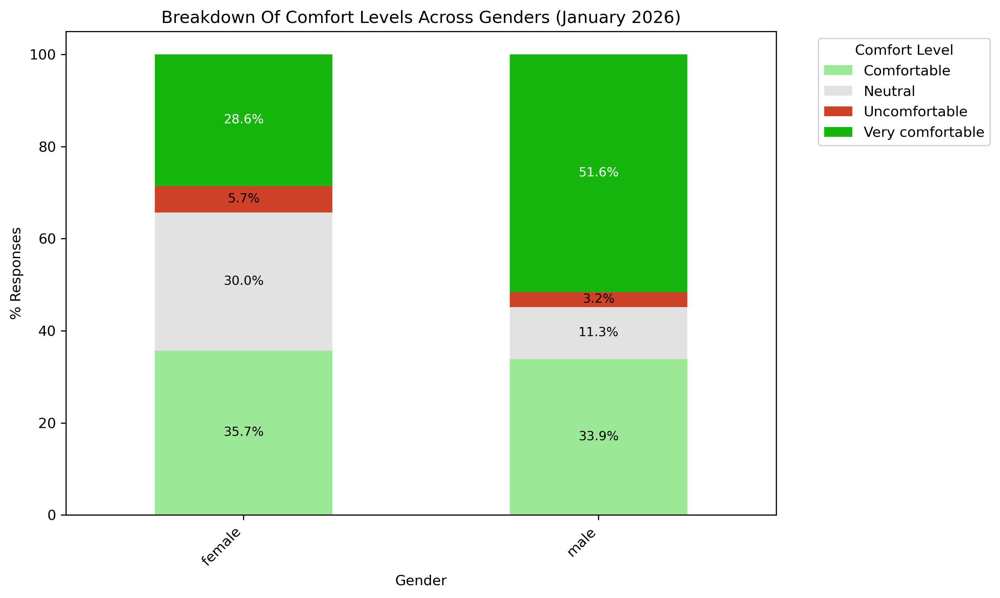

In [70]:
plot_comfort(
    df= jan26, 
    category_col= 'Gender',
    comfort_level = 'How comfortable do you feel interacting with Muslims in your community?',
    title='Breakdown Of Comfort Levels Across Genders (January 2026)',
    xlabel='Gender',
    ylabel='% Responses',
)

## Educational Level Vs. Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/~45%_of_the_Survey_Participants_Went_to_Graduate_School_January_2026.png


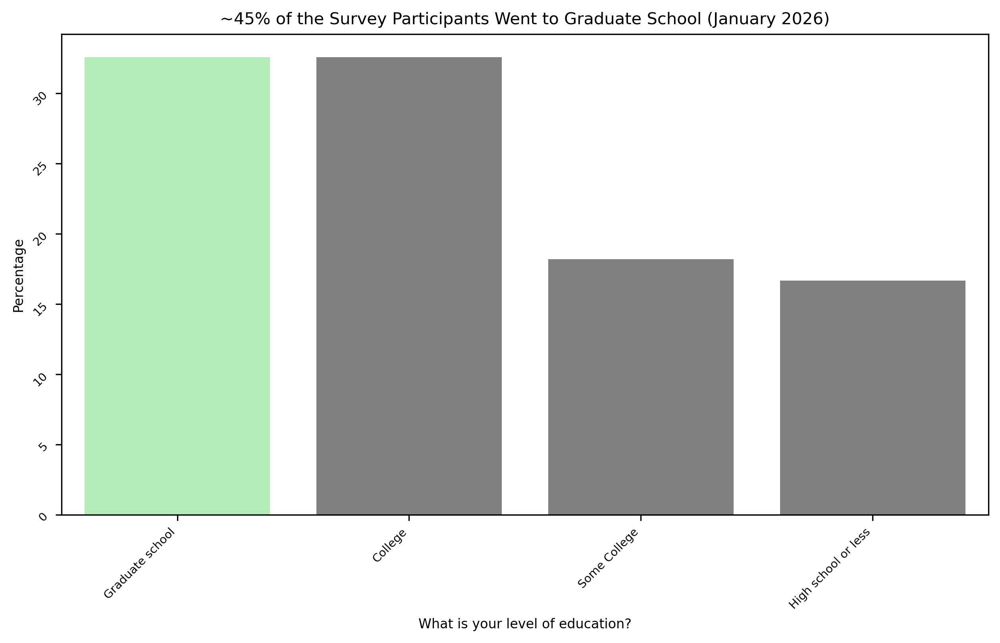

In [71]:
plot_percentages(jan26,'What is your level of education?', 'What is your level of education?',
           '~45% of the Survey Participants Went to Graduate School (January 2026)')

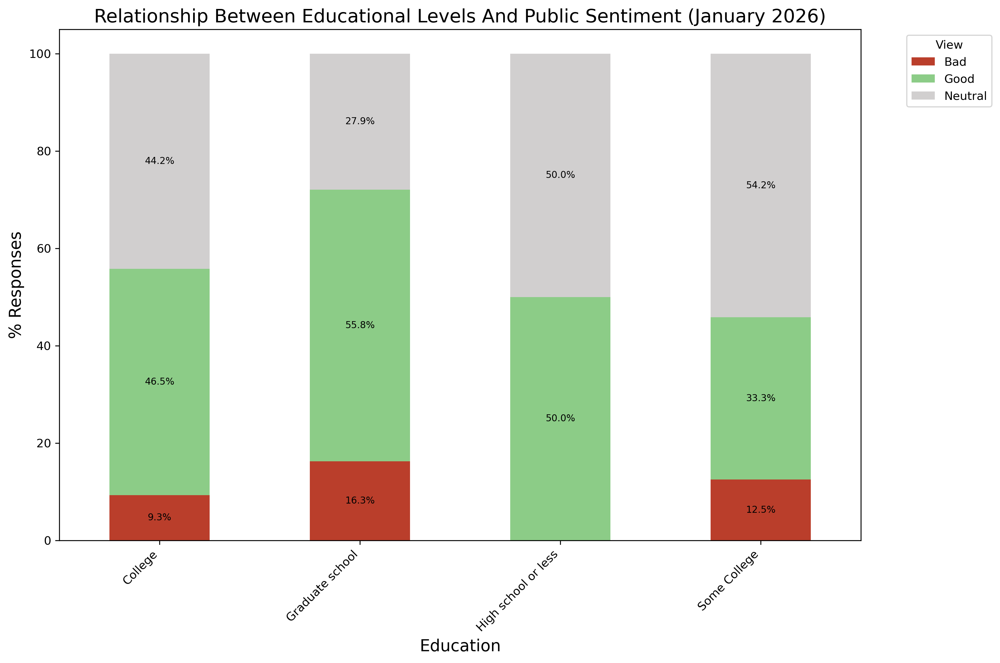

In [72]:
plot_stacked_bar_chart(
    df=jan26, 
    title='Relationship Between Educational Levels And Public Sentiment (January 2026)',
    xlabel='Education',
    ylabel='% Responses',
    cat_col= 'What is your level of education?',
    sent_col='How do you feel about Muslim people in America?'
)

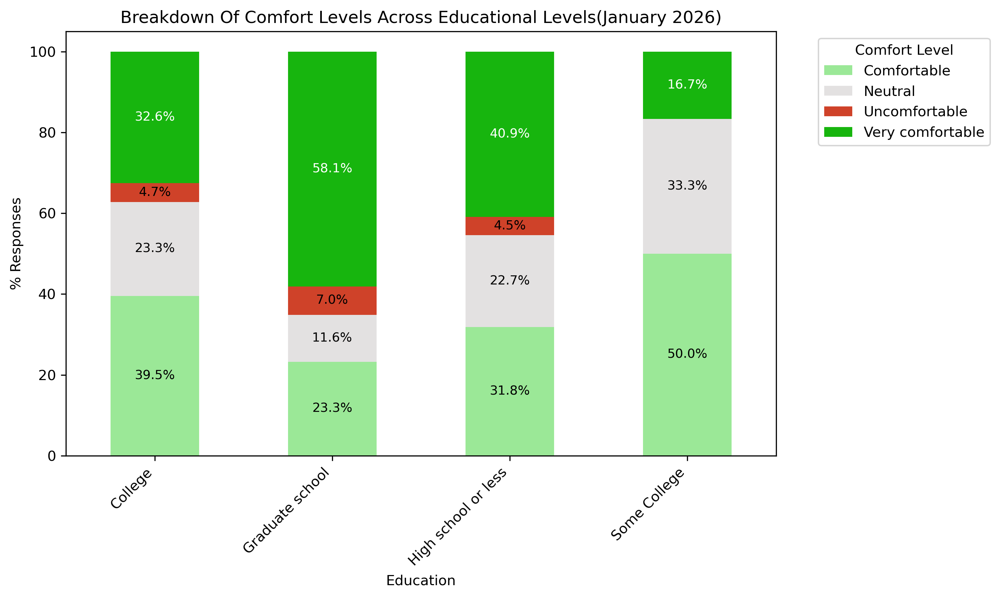

In [73]:
plot_comfort(
    df= jan26, 
    category_col= 'What is your level of education?',
    comfort_level = 'How comfortable do you feel interacting with Muslims in your community?',
    title='Breakdown Of Comfort Levels Across Educational Levels(January 2026)',
    xlabel='Education',
    ylabel='% Responses',
)

## Relationship Between Event Exposure and Overall Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Distribution_Of_Exposure_to_Muslim-Sponsored_Events_January_2026.png


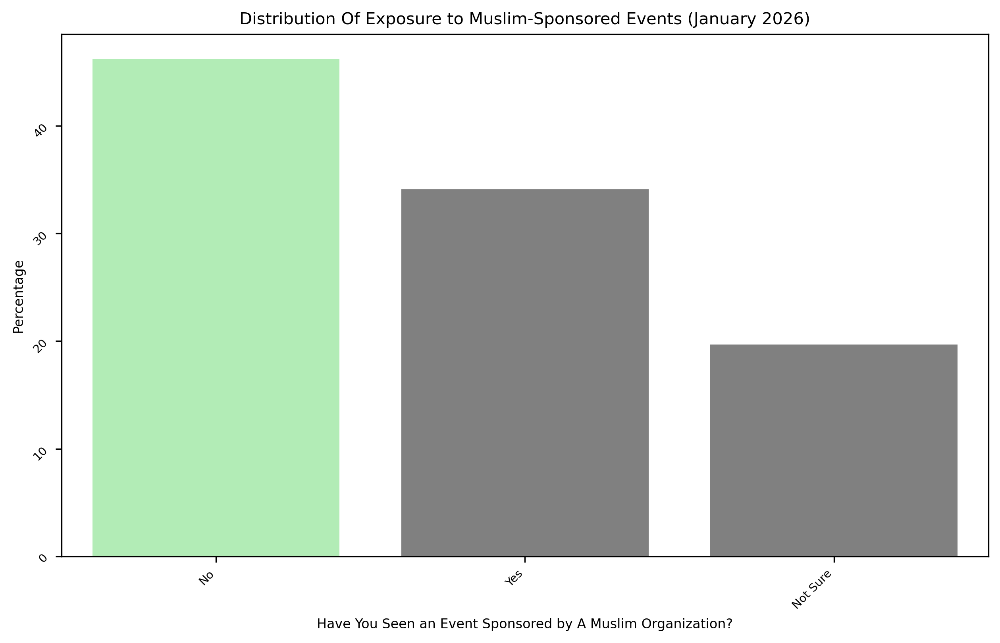

In [75]:
column_name= 'In the last 30 days, have you come across any events or activities \
sponsored by a Muslim person or organization?'
df= jan26
x_label= "Have You Seen an Event Sponsored by A Muslim Organization?"
title= "Distribution Of Exposure to Muslim-Sponsored Events (January 2026)"
    
plot_percentages(df, column_name, x_label, title)

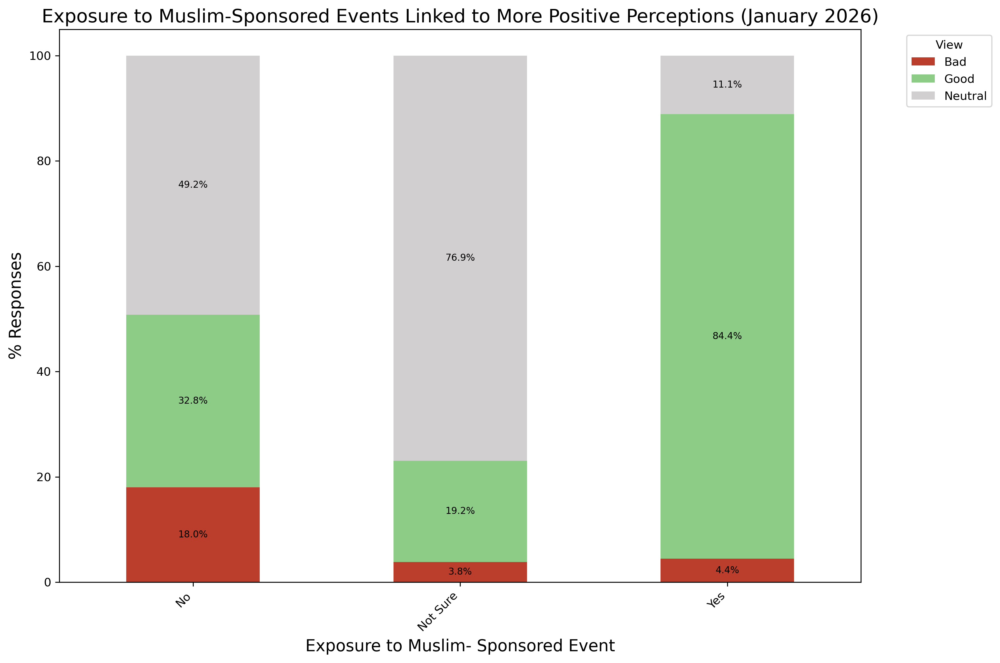

In [76]:
plot_stacked_bar_chart(
    df=jan26, 
    title="Exposure to Muslim-Sponsored Events Linked to More Positive Perceptions (January 2026)",
    xlabel='Exposure to Muslim- Sponsored Event',
    ylabel='% Responses',
    cat_col= column_name,
    sent_col='How do you feel about Muslim people in America?'
)

In [77]:
grouped = (
    jan26.groupby(['What is your religion?', column_name, 'How do you feel about Muslim people in America?'])
    .size()
    .reset_index(name='count')
)

# Normalize within each religion + exposure group to get percentages
grouped['percent'] = grouped.groupby(['What is your religion?', column_name])['count'].\
transform(lambda x: 100 * x / x.sum())

Text(0.5, 0.98, 'Perceptions of Muslims by Exposure and Religious Affiliation (October 2025)')

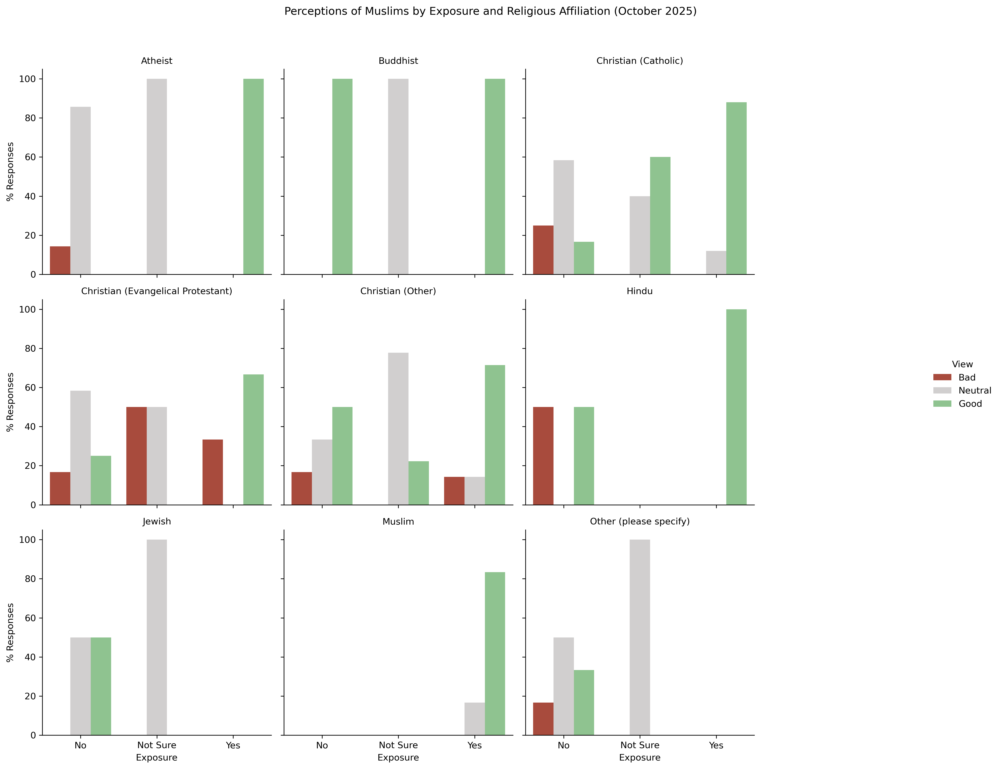

In [78]:
import seaborn as sns
import matplotlib.pyplot as plt

g = sns.catplot(
    data=grouped,
    kind='bar',
    x=column_name,
    y='percent',
    hue='How do you feel about Muslim people in America?',
    col='What is your religion?',
    col_wrap=3,
    height=4,
    palette={'Good': '#86cc87', 'Neutral': '#d1cfcf', 'Bad': '#ba3e2b'}
)

g.set_titles("{col_name}")
g.set_axis_labels("Exposure", "% Responses")
g._legend.set_title("View")
plt.subplots_adjust(top=0.9)
g.fig.suptitle("Perceptions of Muslims by Exposure and Religious Affiliation (October 2025)")

# Level of Engagement with Muslims

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Over_85%_of_the_Survey_Participants_Are_Comfortable_Buying_From_Muslims_January_2026.png


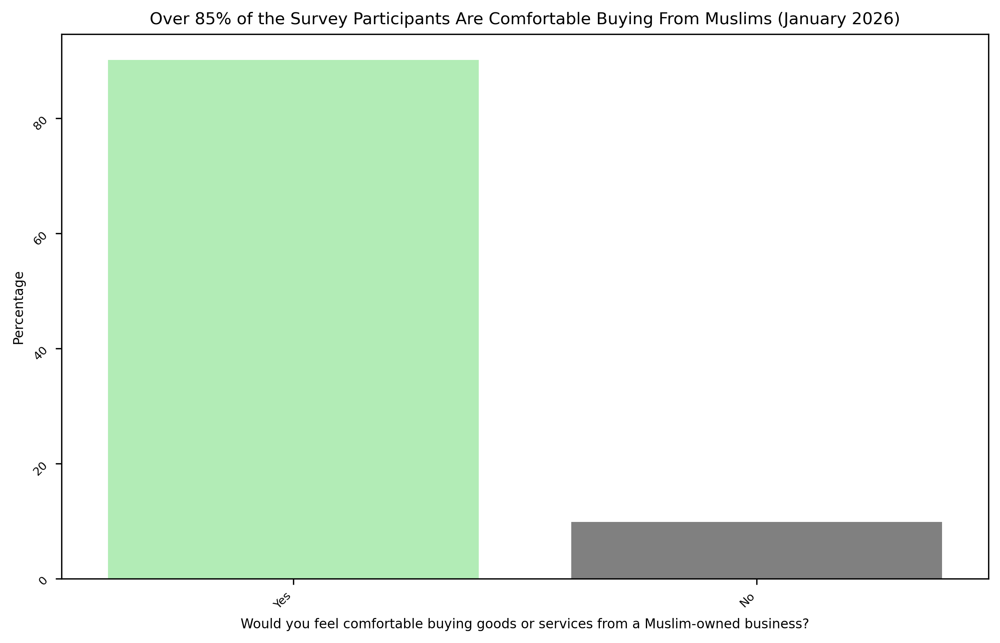

In [80]:
plot_percentages(jan26,'Would you feel comfortable buying goods or services from a Muslim-owned business?',\
                 'Would you feel comfortable buying goods or services from a Muslim-owned business?',
           'Over 85% of the Survey Participants Are Comfortable Buying From Muslims (January 2026)')

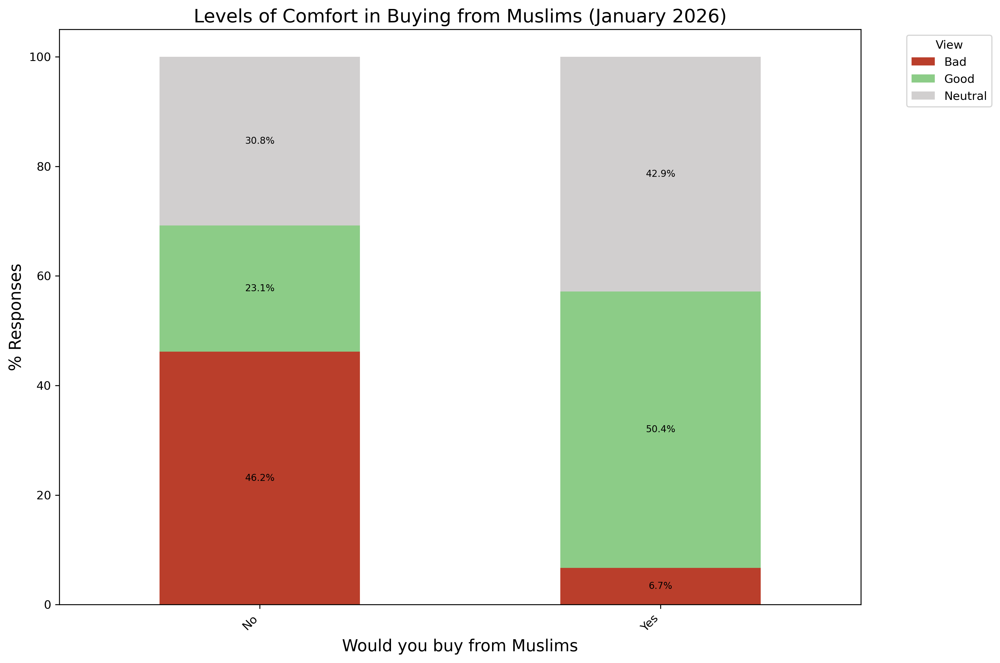

In [81]:
plot_stacked_bar_chart(
    df=jan26, 
    title="Levels of Comfort in Buying from Muslims (January 2026)",
    xlabel='Would you buy from Muslims',
    ylabel='% Responses',
    cat_col= 'Would you feel comfortable buying goods or services from a Muslim-owned business?',
    sent_col='How do you feel about Muslim people in America?'
)

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/53%_of_the_Survey_Participants_Are_Comfortable_Visting_A_Mosque_January_2026.png


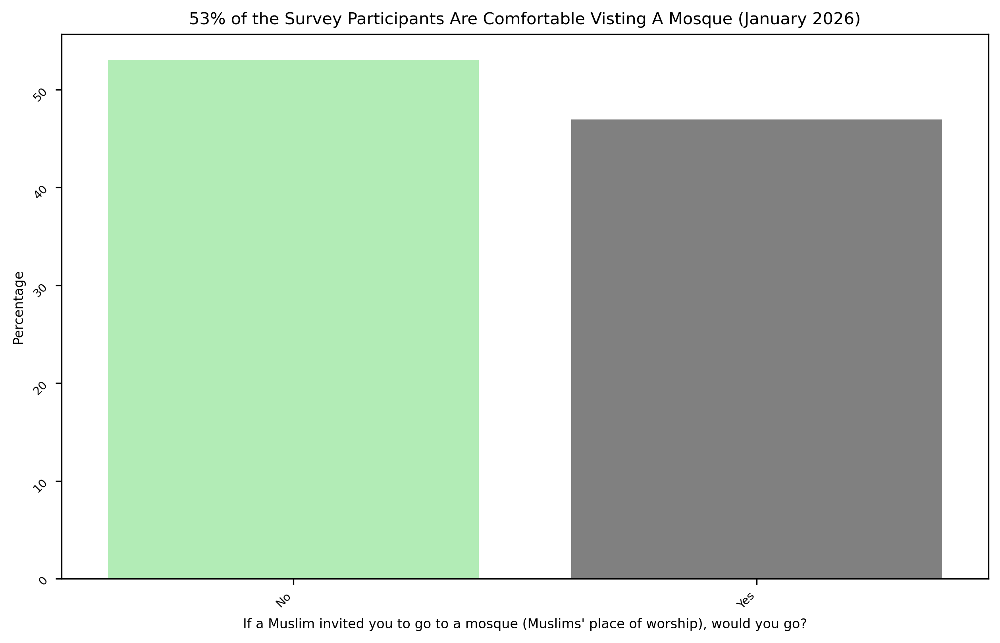

In [82]:
plot_percentages(jan26,"If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",\
                 "If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",
           "53% of the Survey Participants Are Comfortable Visting A Mosque (January 2026)")

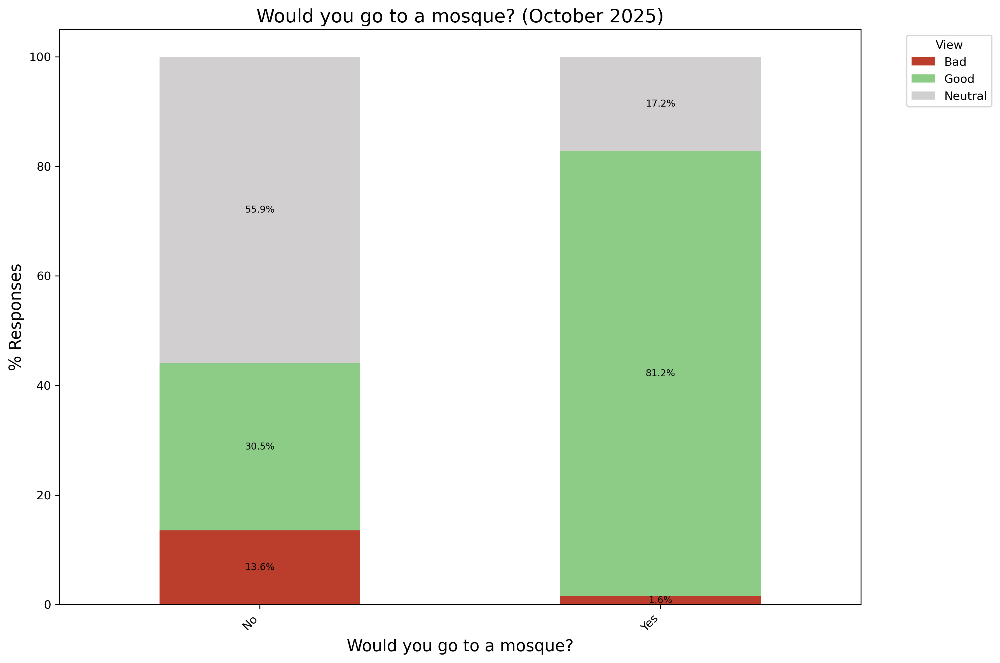

In [89]:
plot_stacked_bar_chart(
    df=oct25, 
    title="Would you go to a mosque? (October 2025)",
    xlabel='Would you go to a mosque?',
    ylabel='% Responses',
    cat_col= "If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",
    sent_col='How do you feel about Muslim people in America?'
)

# Characteristics of Those Who Answered No

## “What religions/gender/income group...etc do the ‘No’ respondents belong to?”

In [90]:
def summarize_group(df, columns):
    """
    Returns a DataFrame summarizing the percentage distribution
    of each unique value in the selected columns.

    Parameters:
    - df: The filtered DataFrame (e.g., those who said "No" to visiting a mosque)
    - columns: List of column names to summarize

    Returns:
    - Dictionary of DataFrames for each column
    """
    summary_tables = {}
    for col in columns:
        summary = df[col].value_counts(normalize=True, dropna=False).mul(100).round(1).rename("Percentage")
        summary_tables[col] = summary.to_frame()
    return summary_tables


In [91]:
no_mosque = oct25[
    oct25["If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?"] == "No"
]

columns_to_summarize = [
    "What is your religion?",
    "Age",
    "Household_Income",
    "Major US Region",
    "Gender",
    "Where do you get your news from?",
    "How do you feel about Muslim people in America?",
    "In the last 30 days, have you come across any events or activities sponsored by a Muslim person or organization?",
    "How would you rate your own understanding of Muslim religious practices (e.g., Ramadan, daily prayers)?",
    "Do you feel you have a lot in common with Muslims in America?",
    "If you had questions about Islam or Muslims, where would you go to learn more?",
    "Have you ever changed your opinion about a group of people after getting to know someone personally"
    
]

summary_results = summarize_group(no_mosque, columns_to_summarize)


In [94]:
print("=======Religion==========")
summary_results["What is your religion?"]
print("=====Age=====")
summary_results["Age"]
print("====Gender======")
summary_results["Gender"]
print("====News======")
summary_results["Where do you get your news from?"]

=======Religion==========


,Percentage
Christian (Evangelical Protestant),30.5
Christian (Other),27.1
Christian (Catholic),18.6
Atheist,16.9
Jewish,3.4
Hindu,1.7
Other (please specify),1.7


=====Age=====


,Percentage
30_to_44,40.7
60_above,25.4
45_to_60,22.0
18_to_29,11.9


====Gender======


,Percentage
female,59.3
male,40.7


====News======


,Percentage
Other (please specify),23.7
Facebook,15.3
Youtube,11.9
FOX News,11.9
Google News,10.2
NPR,8.5
CNN,8.5
Twitter,6.8
Reddit,3.4


Of everyone who said "No", 18.6% were Catholic, 27.1% were "Christian (Other)", 16.9% were atheists.

## “What proportion within each religious group said they wouldn’t go to the mosque?”

To avoid misinterpretation, without normalizing by group size, large groups (like Catholics) may dominate the "No" responses just because there are more of them — not because they are more likely to say "No."

In [95]:
def normalize_by_group( df, col, mosque):
    summary = pd.crosstab(
    df[col],
    df[mosque],
    normalize='index'
).mul(100).round(1)
    return summary

In [96]:
normalize_by_group(oct25,"What is your religion?"\
                   , "If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?")

"If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",No,Yes
What is your religion?,,
Atheist,66.7,33.3
Buddhist,0.0,100.0
Christian (Catholic),28.9,71.1
Christian (Evangelical Protestant),72.0,28.0
Christian (Other),55.2,44.8
Hindu,50.0,50.0
Jewish,50.0,50.0
Muslim,0.0,100.0
Other (please specify),33.3,66.7


In [97]:
normalize_by_group(oct25,"Age"\
                   , "If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?")

"If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",No,Yes
Age,,
18_to_29,43.8,56.2
30_to_44,46.2,53.8
45_to_60,37.1,62.9
60_above,75.0,25.0


In [98]:
normalize_by_group(oct25,"Where do you get your news from?"\
                   , "If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?")

"If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",No,Yes
Where do you get your news from?,,
CNN,33.3,66.7
FOX News,46.7,53.3
Facebook,36.0,64.0
Google News,85.7,14.3
NPR,71.4,28.6
Other (please specify),56.0,44.0
Reddit,40.0,60.0
Twitter,30.8,69.2
Youtube,63.6,36.4


In [101]:
normalize_by_group(oct25,"If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",
    "Have you ever changed your opinion about a group of people after getting to know someone personally")

Have you ever changed your opinion about a group of people after getting to know someone personally,No,Not sure,Yes
"If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",,,
No,30.5,28.8,40.7
Yes,15.6,7.8,76.6


# Common Grounds With Muslims

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Close_to_30%_of_Survey_Participants_Feel_They_Do_Not_Have_A_Lot_In_Common_With_Muslims_October_2025.png


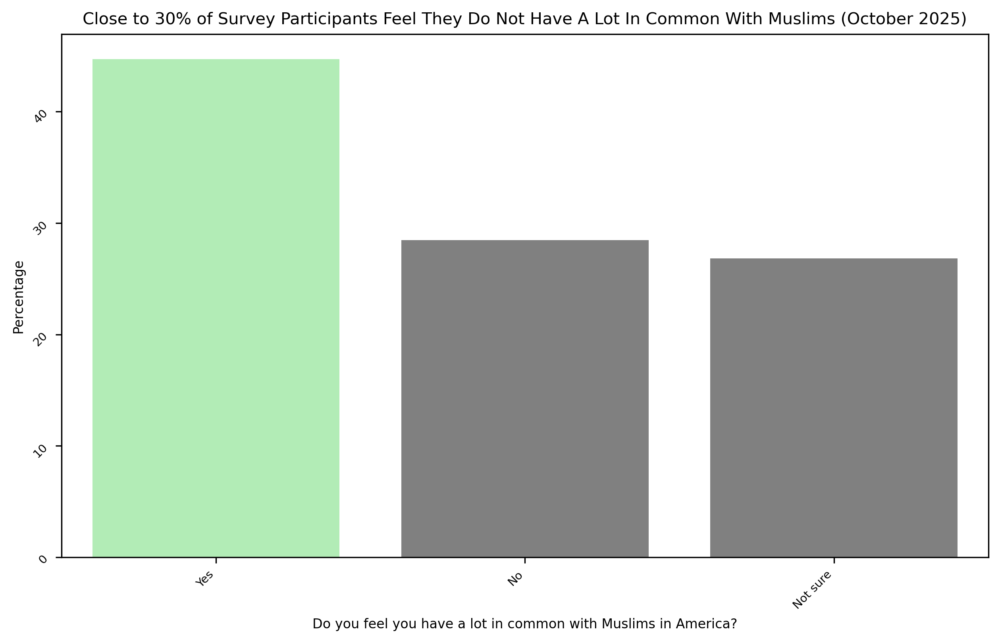

In [104]:
plot_percentages(oct25,'Do you feel you have a lot in common with Muslims in America?',\
                 'Do you feel you have a lot in common with Muslims in America?',
           'Close to 30% of Survey Participants Feel They Do Not Have A Lot In Common With Muslims (October 2025)')

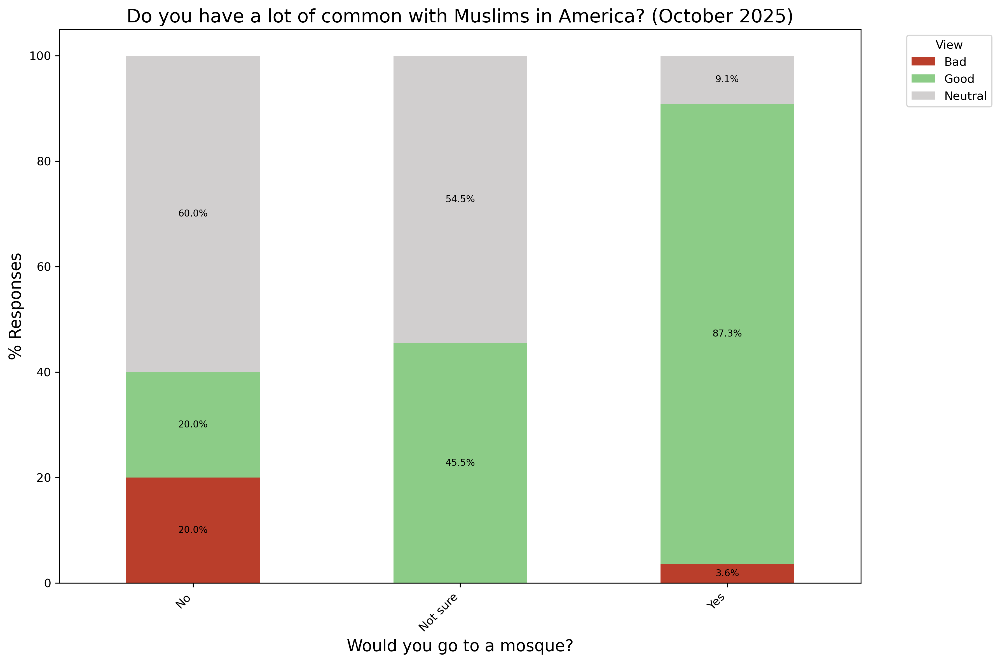

In [106]:
plot_stacked_bar_chart(
    df=oct25, 
    title="Do you have a lot of common with Muslims in America? (October 2025)",
    xlabel='Would you go to a mosque?',
    ylabel='% Responses',
    cat_col= "Do you feel you have a lot in common with Muslims in America?",
    sent_col='How do you feel about Muslim people in America?'
)